In [5]:
# relevant imports
from datetime import datetime
import requests
import json
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
import networkx as nx
import matplotlib.pyplot as plt
#from fa2_modified import ForceAtlas2
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from wordcloud import WordCloud
import numpy as np
import pandas as pd
from sentence_transformers import SentenceTransformer
import community as community_louvain 
from nltk.probability import FreqDist
from collections import defaultdict, Counter
#import seaborn as sns
#import pycountry
from matplotlib.colors import ListedColormap
#from textblob import TextBlob
# nltk.download('punkt')
# nltk.download('stopwords')
# nltk.download('wordnet')
# nltk.dowlnoad('punkt_tab')


## Save and preprocess speeches data

We start by retrieving U.S. presidential speeches data using the [Miller Center API](https://data.millercenter.org/api.html). The data is fetched in multiple requests to handle pagination and saved into a JSON file for later use.


In [2]:
'''# api call to get all speeches
endpoint = "https://api.millercenter.org/speeches"
r = requests.post(url = endpoint)
data = r.json()
items = data['Items']

# collect all speeches
while 'LastEvaluatedKey' in data:
  parameters = {"LastEvaluatedKey": data['LastEvaluatedKey']['doc_name']}
  r = requests.post(url = endpoint, params = parameters)
  data = r.json()
  items.extend(data.get('Items', []))

# save the collected items to a JSON file
with open('speeches.json', 'w') as f:
  json.dump(items, f, indent=4)'''

'# api call to get all speeches\nendpoint = "https://api.millercenter.org/speeches"\nr = requests.post(url = endpoint)\ndata = r.json()\nitems = data[\'Items\']\n\n# collect all speeches\nwhile \'LastEvaluatedKey\' in data:\n  parameters = {"LastEvaluatedKey": data[\'LastEvaluatedKey\'][\'doc_name\']}\n  r = requests.post(url = endpoint, params = parameters)\n  data = r.json()\n  items.extend(data.get(\'Items\', []))\n\n# save the collected items to a JSON file\nwith open(\'speeches.json\', \'w\') as f:\n  json.dump(items, f, indent=4)'

In [6]:
# load data from the JSON file
with open('speeches.json', 'r') as f:
  speeches = json.load(f)

The speech dates are converted to datetime objects for easier manipulation. Only speeches from 1790 onward are kept, as GDP data starts from that year.

In [7]:
# convert the date strings to datetime objects
for speech in speeches:
    date_str = speech['date'][:10]
    speech['date'] = datetime.strptime(date_str, '%Y-%m-%d')

# consider only speeches after 1790, as we only have gdp data from 1790-2024
speeches = [speech for speech in speeches if speech['date'].year >= 1790]


In [8]:
# initial data statistics
print(f'Number of speeches: {len(speeches)}')
presidents = set(speech['president'] for speech in speeches)
print(f'Number of presidents: {len(presidents)}')
speeches.sort(key=lambda x: x['date'])
print(f'Time span: {speeches[0]["date"].year} - {speeches[-1]["date"].year}')


Number of speeches: 1055
Number of presidents: 45
Time span: 1790 - 2024


In this step, the text of each speech is encoded into embeddings using the SentenceTransformer model. The cosine similarity matrix is then computed to assess the similarity between speeches.

In [9]:
# get text embeddings for each speech
model = SentenceTransformer('all-MiniLM-L6-v2')
embeddings = model.encode([speech['transcript'] for speech in speeches])

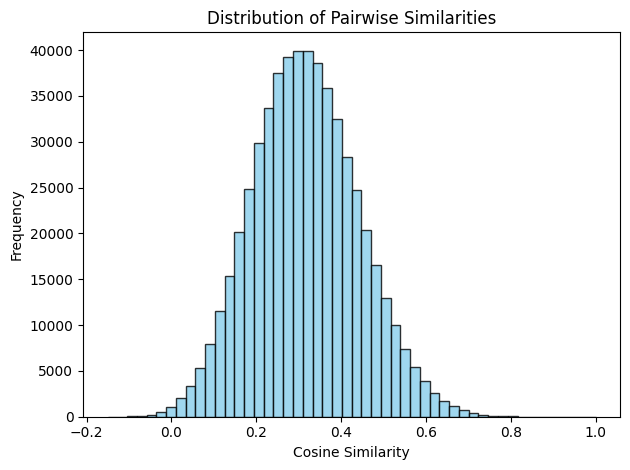

In [11]:
# compute the cosine similarity matrix
similarity_matrix = cosine_similarity(embeddings)
# get the upper triangle of the matrix without the diagonal (remove repeated pairs and self-similarity)
upper_triangle = similarity_matrix[np.triu_indices_from(similarity_matrix, k=1)]
# plot bar chart of the distribution of pairwise similarities
hist, bin_edges = np.histogram(upper_triangle.flatten(), bins=50)
bin_centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])
plt.bar(bin_centers, hist, width=bin_edges[1] - bin_edges[0], color='skyblue', edgecolor='black', alpha=0.8)
plt.xlabel('Cosine Similarity')
plt.ylabel('Frequency')
plt.title('Distribution of Pairwise Similarities')
plt.tight_layout()
plt.show()

**Threshold Selection:**
 
A range of thresholds (0.3 to 0.9) is tested to determine the optimal similarity score for creating edges in the network. The metrics of interest include
- Largest Connected Component Size: Number of nodes in the largest connected subgraph.
- Modularity: Evaluates the quality of the network partitioning.
- Average Degree: Average number of edges per node.
- Density: Represents the fraction of actual edges relative to the maximum possible edges.

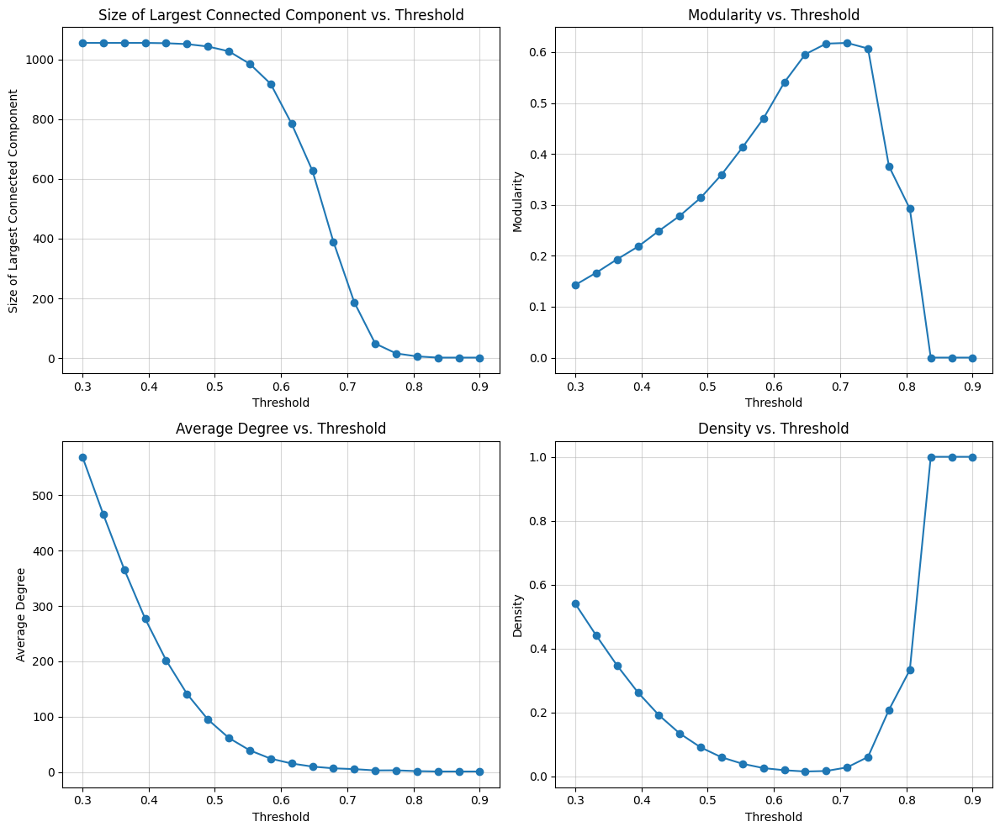

In [12]:
# find optimal threshold of similarity for edge creation 
thresholds = np.linspace(0.3, 0.9, 20)
metrics = {'density': [], 'modularity': [], 'avg_degree': [], 'largest_cc_size': []}
i_indices, j_indices = np.triu_indices_from(similarity_matrix, k=1)
similarity_list = [(i, j, similarity_matrix[i, j]) for i, j in zip(i_indices, j_indices)]

for threshold in thresholds:
    # create graph
    G = nx.Graph()
    G.add_nodes_from(range(len(similarity_matrix)))
    # eges based on similarity
    for i in range(len(speeches)):
        for j in range(i + 1, len(speeches)):
            if similarity_matrix[i][j] > threshold:
                G.add_edge(i, j, weight=similarity_matrix[i][j])
    
    # calculate network metrics
    # largest connected component
    largest_component = max(nx.connected_components(G), key=len)
    largest_cc_size = len(largest_component)
    metrics['largest_cc_size'].append(largest_cc_size)
    largest_cc = G.subgraph(largest_component)
    # remove nodes with degree 0
    G = G.subgraph([node for node in G.nodes() if G.degree(node) > 0])
    # density
    metrics['density'].append(nx.density(largest_cc))
    # average degree
    avg_degree = np.mean([deg for _, deg in largest_cc.degree()])
    metrics['avg_degree'].append(avg_degree)
    # modularity
    modularity = community_louvain.modularity(community_louvain.best_partition(largest_cc), largest_cc)
    metrics['modularity'].append(modularity)

# visualize metrics in different plots
plt.subplots(2, 2, figsize=(12, 10))
plt.subplot(2, 2, 1)
plt.plot(thresholds, metrics['largest_cc_size'], marker='o')
plt.xlabel('Threshold')
plt.ylabel('Size of Largest Connected Component')
plt.title('Size of Largest Connected Component vs. Threshold')
plt.grid(alpha=0.5)
plt.subplot(2, 2, 2)
plt.plot(thresholds, metrics['modularity'], marker='o')
plt.xlabel('Threshold')
plt.ylabel('Modularity')
plt.title('Modularity vs. Threshold')
plt.grid(alpha=0.5)
plt.subplot(2, 2, 3)
plt.plot(thresholds, metrics['avg_degree'], marker='o')
plt.xlabel('Threshold')
plt.ylabel('Average Degree')
plt.title('Average Degree vs. Threshold')
plt.grid(alpha=0.5)
plt.subplot(2, 2, 4)
plt.plot(thresholds, metrics['density'], marker='o')
plt.xlabel('Threshold')
plt.ylabel('Density')
plt.title('Density vs. Threshold')
plt.grid(alpha=0.5)
plt.tight_layout()
plt.show()



From the plots above, a treshold between 0.6 to 0.65 seems to provide the best balance between high modularity and a sufficiently large largest connected component to preserve network interpretability.
Therefore, **0.625** is chosen as the similarity threshold for edge creation in our network, balancing modularity and connectedness, which should result in distinct communities without significant loss in network size.

## Create speeches network

We can now create out U.S. presidential speeches network, where each node represents a speech and weighted edges are formed between speeches that share a cosine similarity greater than 0.625.
Each node includes initially the speech title, president, date and transcript as attributes.

In [13]:
# create a graph where nodes are speeches and edges are similarities
SpeechNet = nx.Graph()

# ddd nodes with attributes (each node is a speech)
for i, speech in enumerate(speeches):
    SpeechNet.add_node(i, title=speech['title'], president=speech['president'], date=speech['date'], transcript=speech['transcript'])

# ddd edges between speeches with similarity greater than 0.625
threshold = 0.625
for i in range(len(speeches)):
    for j in range(i + 1, len(speeches)):
        if similarity_matrix[i][j] > threshold:
            # add edge with weight equal to similarity
            SpeechNet.add_edge(i, j, weight=similarity_matrix[i][j])

The network is reduced to the largest connected component to focus on the most significant part of the network and nodes with no connections are removed.

In [14]:
# consider only the largest connected component
largest_cc = max(nx.connected_components(SpeechNet), key=len)
SpeechNet = SpeechNet.subgraph(largest_cc)

In [15]:
# remove isolated nodes
SpeechNet = SpeechNet.subgraph([node for node in SpeechNet.nodes() if SpeechNet.degree(node) > 0])

In [16]:
# print node and edge counts
print(f'Numer of Nodes: {SpeechNet.number_of_nodes()}')
print(f'Number of Edges: {SpeechNet.number_of_edges()}')

Numer of Nodes: 743
Number of Edges: 5041


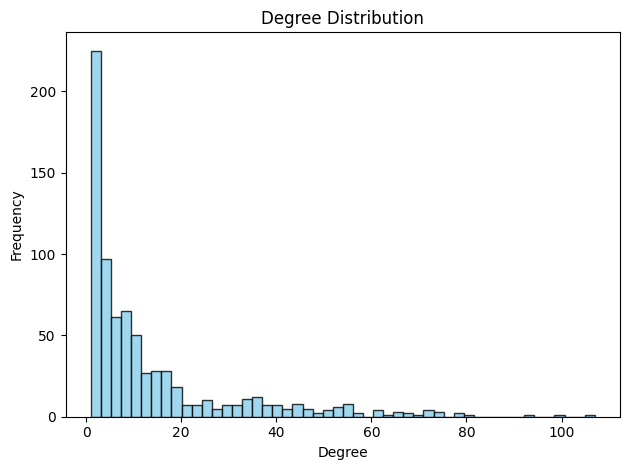

In [17]:
# plot degree distribution
degrees = [degree for node, degree in SpeechNet.degree()]
hist, bin_edges = np.histogram(degrees, bins=50)
bin_centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])
plt.bar(bin_centers, hist, width=bin_edges[1] - bin_edges[0], color='skyblue', edgecolor='black', alpha=0.8)
plt.xlabel('Degree')
plt.ylabel('Frequency')
plt.title('Degree Distribution')
plt.tight_layout()
plt.show()


From the degree distribution plot we can see that.... 

## Community analysis

**Modularity** measures the strength of community structure in a network by comparing the density of links within communities to what would be expected in a random network. The score ranges from -1 to 1, where higher values indicate stronger community structures, and values close to zero or negative suggest weak or no structure. This helps identifying groups with more connections within themselves than to other groups.

In [20]:
# position nodes using Force Atlas 2
# forceatlas2 = ForceAtlas2(verbose=False, scalingRatio=0.2)
# positions = forceatlas2.forceatlas2_networkx_layout(SpeechNet, pos=None, iterations=2000)

positions = nx.spring_layout(SpeechNet, seed=42)

**Partition of the network into parties:**

Characterize each node's party as the delivering president's party.

In [21]:
from parties import president_party, party_colors
node_colors = []

for node in SpeechNet.nodes():
    president = SpeechNet.nodes[node]['president']
    party = president_party.get(president, "None")
    # add party attribute to nodes  
    SpeechNet.nodes[node]['party'] = party
    # add color to nodes based on party
    color = party_colors.get(party, "gray") 
    node_colors.append(color)

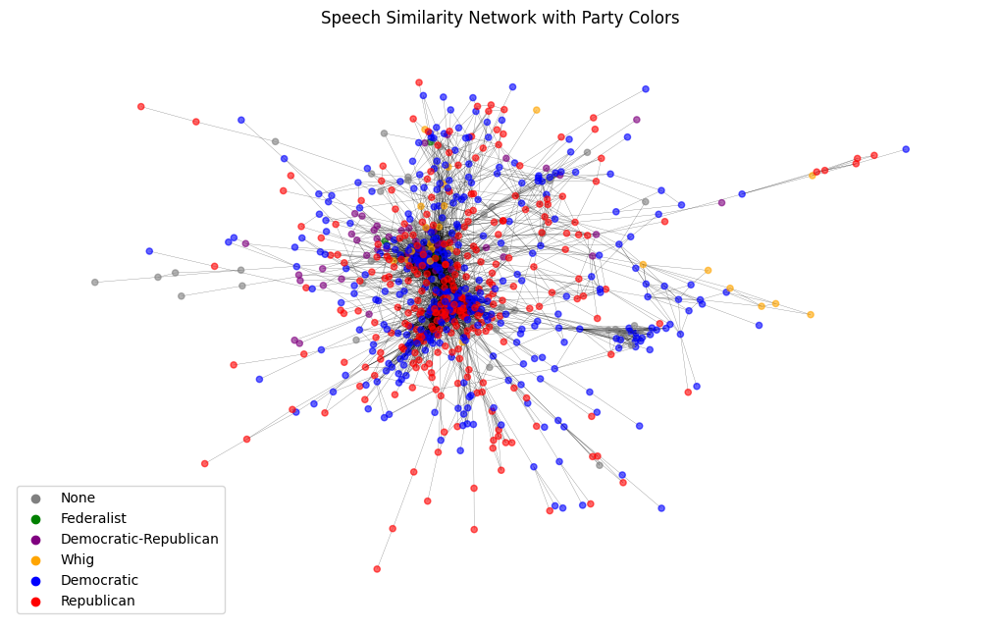

In [22]:
# plot the network with party colors
plt.figure(figsize=(10,6))
nx.draw(SpeechNet, pos=positions, with_labels=False, node_size=20, alpha=0.6, node_color=node_colors, width=0.2)
for party, color in party_colors.items():
    plt.scatter([], [], c=color, label=party)
plt.legend(scatterpoints=1, loc='best')
plt.title('Speech Similarity Network with Party Colors')
plt.show()

In [23]:
# create a dictionary to map parties to their respective nodes
parties_dict = {}
for node, data in SpeechNet.nodes(data=True):
    party = data.get('party')
    if party not in parties_dict:
        parties_dict[party] = []
    parties_dict[party].append(node)

# calculate modularity for parties communities
modularity = 0.0
L = SpeechNet.number_of_edges()  # number of edges in the network
for genre, nodes in parties_dict.items():
    genre_subgraph = SpeechNet.subgraph(nodes)
    L_c = genre_subgraph.number_of_edges()  # number of edges within the genre community
    K_c = sum(dict(SpeechNet.degree(nodes)).values())  # sum of degrees of nodes within the genre community
    modularity += (L_c / L) - ((K_c / (2 * L)) ** 2)
print(f'Modularity considering parties: {modularity}')

Modularity considering parties: 0.07699803488010101


The network's modularity when considering the party affiliations of the presidents, suggests a weak community structure based on parties. This indicates that party affiliation might not be the strongest factor in clustering similar speeches, i.e., presidents from the same party do not tend to have speeches that are more similar to each other than to those from presidents of different parties.

This is further evidenced by the network plot, where the mixture of colors representing different parties shows that speeches from presidents of the same party are not clearly grouped together. The blended representation of colors indicates that party affiliation does not strongly influence the clustering of similar speeches.

Finding communities using [the Python Louvain-algorithm implementation](http://perso.crans.org/aynaud/communities/):

In [24]:
# calculate modularity for louvain communities
louvain_partition = community_louvain.best_partition(SpeechNet, random_state=41) 
nx.set_node_attributes(SpeechNet, louvain_partition, 'louvain_community')

In [25]:
# create a dictionary to map louvain communities to their respective nodes
louvain_dict = defaultdict(list)
for node, community in louvain_partition.items():
    louvain_dict[community].append(node)

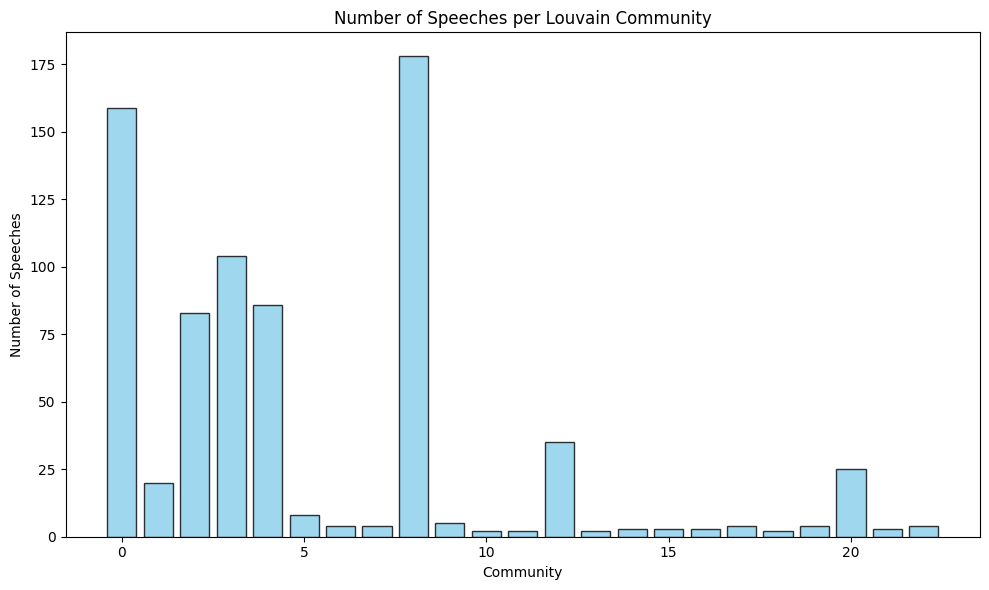

In [26]:
# plot number of speeches per community
community_sizes = [len(nodes) for nodes in louvain_dict.values()]
plt.figure(figsize=(10,6))
plt.bar(range(len(community_sizes)), community_sizes, color='skyblue', edgecolor='black', alpha=0.8)
plt.xlabel('Community')
plt.ylabel('Number of Speeches')
plt.title('Number of Speeches per Louvain Community')
plt.tight_layout()
plt.show()

From the distribution of speeches per community, it is clear that some communities are significantly larger than the majority. This pattern is also visible in the network visualization plot that follows, where dense clusters correspond to these larger communities.

C:\Users\andma\AppData\Local\Temp\ipykernel_14964\2150795855.py:3: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors1 = plt.cm.get_cmap('tab20', 20)
C:\Users\andma\AppData\Local\Temp\ipykernel_14964\2150795855.py:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors2 = plt.cm.get_cmap('tab20b', len(set(louvain_dict.keys())))


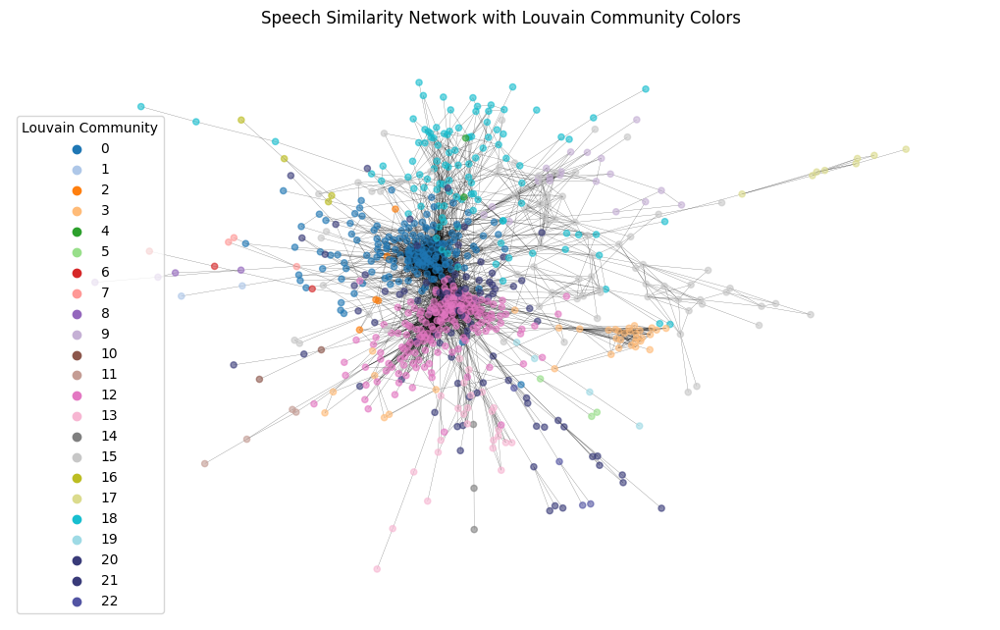

In [27]:
# get colors for louvain communities
louvain_colors = [louvain_partition[node] for node in SpeechNet.nodes()]
colors1 = plt.cm.get_cmap('tab20', 20)
colors2 = plt.cm.get_cmap('tab20b', len(set(louvain_dict.keys())))
combined_colors = np.vstack((colors1(np.linspace(0, 1, colors1.N)), colors2(np.linspace(0, 1, colors2.N))))
colors = ListedColormap(combined_colors)
louvain_colors = {community: colors(i) for i, community in enumerate(set(louvain_dict.keys()))}
# assign colors to nodes
node_colors = [louvain_colors[louvain_partition[node]] for node in SpeechNet.nodes()]
# plot the network with louvain community colors
plt.figure(figsize=(10,6))
nx.draw(SpeechNet, pos=positions, with_labels=False, node_size=20, alpha=0.6, node_color=node_colors, width=0.2)
for community, color in louvain_colors.items():
    plt.scatter([], [], color=color, label=community)
plt.legend(scatterpoints=1, loc='best', title='Louvain Community')
plt.title('Speech Similarity Network with Louvain Community Colors')
plt.show()

In [28]:
louvain_modularity = community_louvain.modularity(louvain_partition, SpeechNet)
print(f"Louvain modularity: {louvain_modularity}")

Louvain modularity: 0.5496065616607666


The modularity of the partitioning of the speech network obtained using the Louvain algorithm is considerably higher than the one obtained based on the parties. This suggests that the algorithm was able to find stronger community structures in the network, indicating that there are additional patterns in the data beyond party affiliation. The relationships within the network can be influenced by different factors such as speech content, political context, etc.

The network visualization with nodes colored according to their Louvain communities further reinforces this insight. We can clearly notice clusters of nodes, representing groups of speeches that are more tightly connected within their communities. The distinct separation between these communities, along with the higher modularity score, shows that the Louvain method has identified more meaningful groupings compared to party affiliation.

Let's compare the communities found by the Louvain-algorithm with the political party affiliations by creating a matrix confusion matrix $D$ with dimension ($G \times C$), where G is the parties and C is the 6 most common communities. 
We set entry $D(i,j)$ to be the number of nodes that genre $i$ has in common with community $j$. 

Calculate G

In [29]:
G = parties_dict.keys()

Calculate C

In [30]:
# top 6 most common communities ordered by the number of speeches in the community of louvain partition

community_count = {key: len(value) for key, value in louvain_dict.items()}
top6_communities = dict(sorted(community_count.items(), key=lambda x: x[1], reverse=True)[:6])

C = top6_communities.keys()

Calculate matrix D

In [31]:
# create matrix of party-community intersections
D = pd.DataFrame(0, index=G, columns=C)
for party in G:
    for community in C:
        D.loc[party, community] = len(set(parties_dict[party]).intersection(louvain_dict[community]))
print('Confusion matrix D:')
print(D)

Confusion matrix D:
                       12  0   18  20  15  3 
None                    7  10   4   2   5   8
Federalist              0   3   0   0   1   0
Democratic-Republican   0  37   4   1   7   0
Democratic             83  51  49  42  40  23
Whig                    0   9   7   0   7   0
Republican             88  49  40  41  23   4


The confusion matrix reveals that the Louvain communities do not align with political party affiliations. While some parties, like the Democratic and Republican parties, show strong overlaps with certain communities (e.g., community 12), there is notable mixing between parties in several communities. This suggests that speech content similarity transcends party lines, indicating that factors beyond party affiliation influenced the speech louvain algorithm partition. The relatively low overlap for smaller parties, like the Federalist and Whig, further emphasizes the complexity of speech patterns in the dataset.

## Sentiment analysis

Sentiment analysis is an important tool in understanding the sentiment behind a piece of text. In the context of our network, analyzing the sentiment of presidential speeches can provide valuable insights into how the tone and emotions in these speeches relate to various factors, such as political strategies, public perceptions, or societal issues at the time. This can be useful for examining trends in sentiment over time, comparing sentiments across different political parties, or analyzing the relationship between sentiment and the community structure discovered earlier.

In our project we use the  LabMT dataset from [Temporal Patterns of Happiness and Information in a Global Social Network: Hedonometrics and Twitter](http://journals.plos.org/plosone/article?id=10.1371/journal.pone.0026752) (Data Set S1) to calculate sentiment scores based on the happiness ratings of words, which reflect the emotional tone typically associated with those words. 

It is important to note that this sentiment analysis relies on the predefined wordlist and reflects only the surface sentiment of the words used in the speeches. This method does not fully capture the audience's emotional reactions or the complete context and nuance of the speeches.

In [32]:
# download sentiment wordlist 
with open('Data_Set_S1.txt', 'r') as f:
    data_S1 = f.read()

data_S1 = [line.split('\t') for line in data_S1.strip().split('\n')]
data_S1 = data_S1[3:]
data_S1 = pd.DataFrame(data_S1[1:], columns = data_S1[0])

Function to process text in the speech transcrits (tokenization, removing ponctuation, setting to lower case, removing stopwords, lemmatizing).

In [33]:
stop_words = set(stopwords.words('english'))
lemmatizer = WordNetLemmatizer()

def process_text(text):
    """
    Process the text by tokenizing, removing punctuation, setting to lowercase, removing stopwords, and lemmatizing.
    """
    # tokenize text
    words = word_tokenize(text)
    # remove punctuation
    words = [word for word in words if word.isalpha()]
    # set to lowercase
    words = [word.lower() for word in words]
    # remove stopwords
    words = [word for word in words if word not in stop_words]
    # lemmatize words
    words = [lemmatizer.lemmatize(word) for word in words]
    return words   



Function to calculate the sentiment score of a certain text based on the average hapiness score of each words in the LabMT wordlist

In [34]:
def sentiment_score(text):
    """
    Calculate the sentiment score of the text based on the sentiment wordlist.
    """
    # process text to get words
    words = process_text(text)
    freq_dist = FreqDist(words)
    # calculate sentiment score
    score = sum(freq_dist[word] *float(data_S1[data_S1['word']==word]['happiness_average'].values[0]) 
                for word in freq_dist if word in data_S1['word'].values)

    total_frequency = sum(freq_dist[word] for word in freq_dist if word in data_S1['word'].values)
    if total_frequency > 0:  # to avoid division by zero
        return score / total_frequency
    else:
        return 0.0

Calculate and save the sentiment for each speech.

In [29]:
'''# calculate sentiment for every node's transcript
sentiments = {}
for node, data in SpeechNet.nodes(data=True):
    speech = node
    transcript = data['transcript']
    sentiments[speech] = sentiment_score(transcript)

# save the sentiment scores to a file
with open('sentiments.txt', 'w') as f:
    for speech, sentiment in sentiments.items():
        f.write(f"{speech} | {sentiment}\n")'''

'# calculate sentiment for every node\'s transcript\nsentiments = {}\nfor node, data in SpeechNet.nodes(data=True):\n    speech = node\n    transcript = data[\'transcript\']\n    sentiments[speech] = sentiment_score(transcript)\n\n# save the sentiment scores to a file\nwith open(\'sentiments.txt\', \'w\') as f:\n    for speech, sentiment in sentiments.items():\n        f.write(f"{speech} | {sentiment}\n")'

Assign scores to nodes as attributes.

In [37]:
# read sentiment scores from file
sentiments = {}
with open('sentiments.txt', 'r') as f:
    for line in f:
        speech, sentiment = line.strip().split(' | ')
        sentiments[speech] = float(sentiment)

# assign sentiment scores to nodes
nx.set_node_attributes(SpeechNet, sentiments, 'sentiment')

print('Sentiment scores assigned to nodes')

Sentiment scores assigned to nodes


In [31]:
# average sentiment
average_sentiment = sum(sentiments.values()) / len(sentiments)
print(f"Average sentiment of the speeches: {average_sentiment}")

# median sentiment
median_sentiment = np.median(list(sentiments.values()))
print(f"Median sentiment of the speeches: {median_sentiment}")

# variance of sentiment
variance_sentiment = np.var(list(sentiments.values()))
print(f"Variance of sentiment of the speeches: {variance_sentiment}")

# 25th percentile of sentiment
percentile_25 = np.percentile(list(sentiments.values()), 25)
print(f"25th percentile of sentiment of the speeches: {percentile_25}")

# 75th percentile of sentiment
percentile_75 = np.percentile(list(sentiments.values()), 75)
print(f"75th percentile of sentiment of the speeches: {percentile_75}")

Average sentiment of the speeches: 5.638436693821281
Median sentiment of the speeches: 5.6295686619718275
Variance of sentiment of the speeches: 0.019115696090402423
25th percentile of sentiment of the speeches: 5.55791905855339
75th percentile of sentiment of the speeches: 5.715860427716681


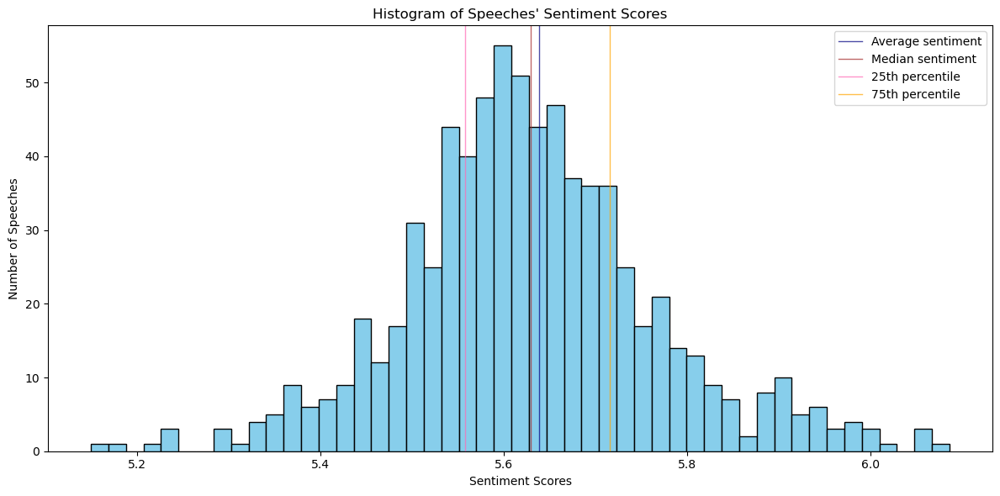

In [32]:
# plot of sentiment distribution of speeches

# create bins for the sentiment scores
min_sentiment = min(sentiments.values())
max_sentiment = max(sentiments.values())
v = np.arange(min_sentiment, max_sentiment + variance_sentiment, variance_sentiment)  

# count the number of artists in each bin
binned_counts, bin_edges = np.histogram(list(sentiments.values()), bins=v)

# bar plot for the histogram
plt.figure(figsize=(12, 6))
plt.bar(bin_edges[:-1], binned_counts, width=np.diff(bin_edges), color='skyblue', edgecolor='black')
# average sentiment line
plt.axvline(average_sentiment, color='navy', linestyle='-', linewidth=1, alpha=0.7)
# median sentiment line
plt.axvline(median_sentiment, color='brown', linestyle='-', linewidth=1, alpha=0.7)
# 25th percentile line
plt.axvline(percentile_25, color='hotpink', linestyle='-', linewidth=1, alpha=0.7)
# 75th percentile line
plt.axvline(percentile_75, color='orange', linestyle='-', linewidth=1, alpha=0.7)
plt.legend(['Average sentiment', 'Median sentiment', '25th percentile', '75th percentile'])
plt.title('Histogram of Speeches\' Sentiment Scores')
plt.xlabel('Sentiment Scores')
plt.ylabel('Number of Speeches')

plt.tight_layout()
plt.show()


The histogram of sentiment scores reflects a near-normal distribution centered around a positive sentiment range, with scores between 5.1 and 6.1. The distribution is slightly right-skewed, suggesting that there are a few speeches with higher sentiment scores compared to the majority. The average sentiment score shows that most speeches exhibit a moderately positive tone. The average sentiment score is closely aligned with the median sentiment, confirming that most speeches tend to have a positive but not extreme tone. The 25th and 75th percentiles show that the interquartile range is narrow, meaning the majority of sentiment scores are clustered within a similar range.The lower tail of the histogram has minimal counts, suggesting that speeches with significantly lower sentiment scores are rare. Overall, there is a tendency toward higher sentiment scores, as reflected by the slightly larger number of speeches in the higher end of the sentiment spectrum.

**TF-IDF analysis:**

In [33]:
# create tf lists for each speech's transcript
tf_speech = {}
for speech, data in SpeechNet.nodes(data=True):
    text = data['transcript']
    words = process_text(text)
    tf_speech[speech] = pd.Series(words).value_counts()

In [34]:
# calculate document frequency for each word
doc_freq = defaultdict(int)
for tf in tf_speech.values():
    for word in tf.index:
        doc_freq[word] += 1

# calculate IDF for each word
idf_speech = {word: np.log(len(tf_speech) / df) for word, df in doc_freq.items()}

In [35]:
# calculate TF-IDF for each speech
tfidf_speech = {}
for speech, tf in tf_speech.items():
    tfidf_speech[speech] = {word: tf[word] * idf_speech[word] for word in tf.index}

Representation of the 10 happiest speeches.

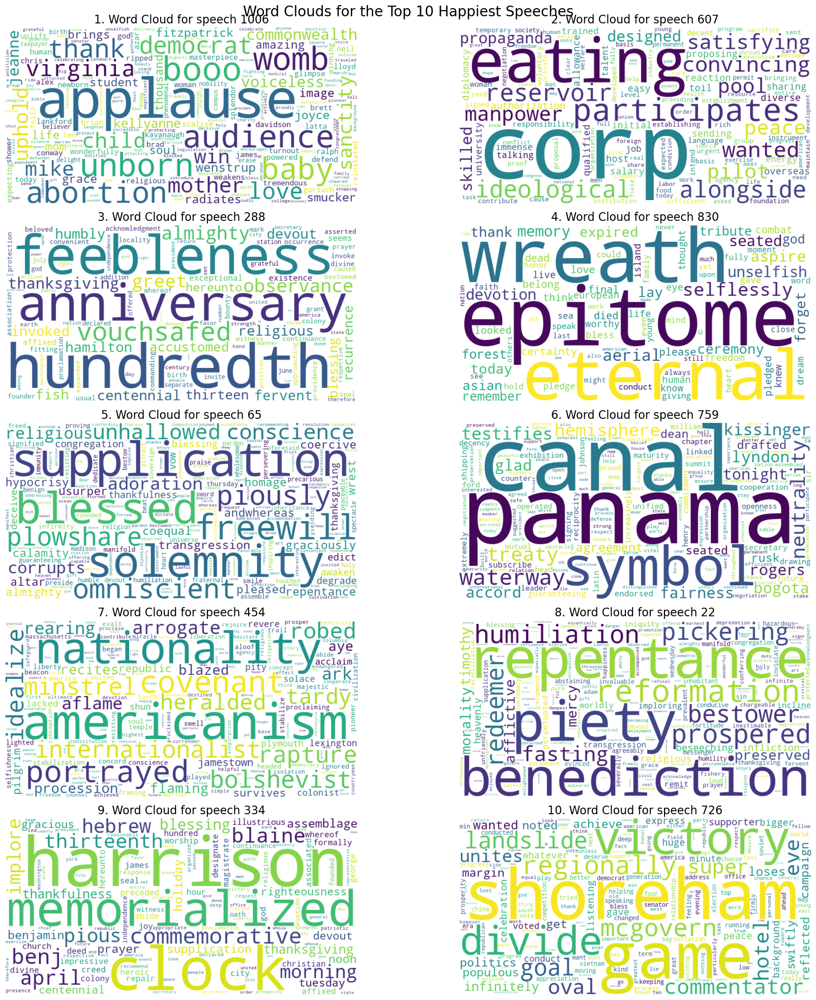

In [36]:
# get the top 10 happiest speeches
happiest_speeches = sorted(sentiments, key=sentiments.get, reverse=True)[:10]

# filter the tfidf_speech dictionary to include only the top 10 happiest speeches
top_tfidf_speeches = {speech: tfidf_speech[speech] for speech in happiest_speeches}

# create word clouds for the top 10 happiest speeches
fig, axs = plt.subplots(5, 2, figsize=(20, 20))
fig.suptitle('Word Clouds for the Top 10 Happiest Speeches', fontsize=20)
for i, (speech, tfidf) in enumerate(top_tfidf_speeches.items()):
    wordcloud = WordCloud(width=800, height=400, collocations=False, background_color='white').generate_from_frequencies(tfidf)
    ax = plt.subplot(5, 2, i + 1)
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis('off')
    plt.title(f"{i+1}. Word Cloud for speech {speech}", fontsize=16)
plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05, hspace=0.3, wspace=0.3)
plt.tight_layout()
plt.show()

In [37]:
# print "legend" of 10 happiest speeches
for i, speech in enumerate(happiest_speeches):
    print(f"{i+1}. Speech {speech}")
    print(f"{SpeechNet.nodes[speech]['title']} by {SpeechNet.nodes[speech]['president']}.")

1. Speech 1006
January 24, 2020: Speech at March for Life by Donald Trump.
2. Speech 607
March 1, 1961: Establishment of the Peace Corps by John F. Kennedy.
3. Speech 288
June 26, 1876: Proclamation Celebrating the Hundredth Anniversary of Independence by Ulysses S. Grant.
4. Speech 830
November 11, 1988: Remarks at the Veteran's Day Ceremony by Ronald Reagan.
5. Speech 65
July 23, 1813: Proclamation on Day of Public Humiliation and Prayer by James Madison.
6. Speech 759
September 7, 1977: Statement on the Panama Canal Treaty Signing by Jimmy Carter.
7. Speech 454
January 20, 1920: Americanism by Warren G. Harding.
8. Speech 22
March 23, 1798: Proclamation of Day of Fasting, Humiliation and Prayer by John Adams.
9. Speech 334
April 4, 1889: Commemoration of the Centennial of Washington’s Inauguration by Benjamin Harrison.
10. Speech 726
November 7, 1972: Remarks on Being Reelected to the Presidency by Richard M. Nixon.


From the word clouds and titles of the 10 happiest speeches, we can observe recurring themes related to patriotism, unity and progress.

Many of the speeches emphasize themes of national pride and unity, such as *Americanism*, *nationality*, *thanksgiving* and *anniversary* both on the wordclouds and titles. For instance Speech 288 by Ulysses S. Grant in 1876, commemorating the *Hundredth Anniversary of Independence*, and Speech 454 by Warren G. Harding in 1920 on *Americanism* express a strong sense of national identity and forward-looking optimism. This optimism can also be observed in the other speeches, where words like *satisfying* and *idealize* are present, indicating that these speeches may reflect optimistic views about the nation's future or the potential for growth. Additionally, there is a focus on themes of remembrance, sacrifice and devotion, such as in *epitome*, *eternal* and *wreath* seen in Speech 830 by Ronald Reagan in 1988, honoring veterans. 

Religious themes also feature prominently in speeches like Speech 65 by James Madison in 1813, where words like *supplication*, *solemnity* and *adoration* reflect national reflection and prayer. Speech 22 by John Adams in 1798, focused on *fasting* and *repentance*, further underscores the importance of humility and reflection in the context of national and spiritual growth.

Speech 1006, delivered by Donald Trump on January 24, 2020, at the *March for Life*, highlights controversial topics such as *abortion*, *unborn* and *baby*, with words like *applause* and *thank* showing the emotional support at the event.


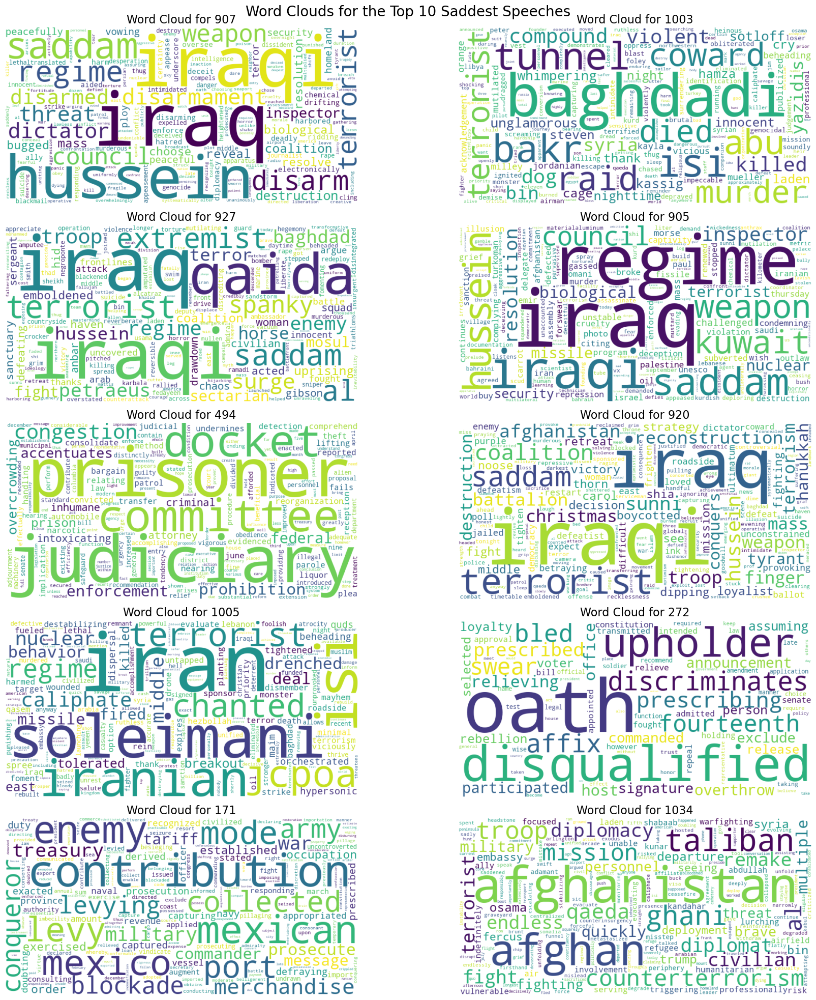

In [38]:
# get the top 10 saddest speeches
saddest_speeches = sorted(sentiments, key=sentiments.get, reverse=False)[:10]

# filter the tfidf_speech dictionary to include only the top 10 saddest speeches
top_tfidf_speeches = {speech: tfidf_speech[speech] for speech in saddest_speeches}

# create word clouds for the top 10 saddest speeches
fig, axs = plt.subplots(5, 2, figsize=(20, 20))
fig.suptitle('Word Clouds for the Top 10 Saddest Speeches', fontsize=20)
for i, (speech, tfidf) in enumerate(top_tfidf_speeches.items()):
    wordcloud = WordCloud(width=800, height=400, collocations=False, background_color='white').generate_from_frequencies(tfidf)
    ax = plt.subplot(5, 2, i + 1)
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis('off')
    plt.title(f"Word Cloud for {speech}", fontsize=16)

plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05, hspace=0.3, wspace=0.3)
plt.tight_layout()
plt.show()

In [39]:
# print "legend" of 10 saddest speeches
for i, speech in enumerate(saddest_speeches):
    print(f"{i+1}. Speech {speech}")
    print(f"{SpeechNet.nodes[speech]['title']} by {SpeechNet.nodes[speech]['president']}.")

1. Speech 907
March 17, 2003: Address to the Nation on Iraq by George W. Bush.
2. Speech 1003
October 27, 2019: Statement on the the Death of Abu Bakr al-Baghdadi by Donald Trump.
3. Speech 927
March 19, 2008: Remarks on the War on Terror by George W. Bush.
4. Speech 905
September 12, 2002: Remarks at the UN General Assembly by George W. Bush.
5. Speech 494
April 28, 1930: Message Regarding Law Enforcement by Herbert Hoover.
6. Speech 920
December 19, 2005: Address on Renewal in Iraq by George W. Bush.
7. Speech 1005
January 8, 2020: Statement on Iran by Donald Trump.
8. Speech 272
February 15, 1871: Veto Message Regarding Restrictions on Rebellion Participants by Ulysses S. Grant.
9. Speech 171
January 2, 1849: Message Regarding War-time Measures by James K. Polk.
10. Speech 1034
August 16, 2021: Remarks on Situation in Afghanistan by Joe Biden.


From the analysis of the top 10 saddest speeches based on sentiment, we can identify the somber tone of their topics. The recurring keywords often relate to war, conflict, and national security, drawing attention to various national and global crises and their gravity and distress.

Words like *iraq*, *hussein*, *saddam* and *regime* present on Speech 907 by George W. Bush, delivered on March 17, 2003, about the *Iraq War*, and *baghdadi*, *terrorist* and *raid* on Speech 1003, given by Donald Trump on October 27, 2019, about the *death of Abu Bakr al-Baghdadi*, underscore the gravity and somberness of military conflicts and operations. Speech 927 by George W. Bush in 2008 features words like *qaida*, *extremist* and *surge*, marking the ongoing struggles in *Iraq and the War on Terror*, while Speech 1034 by Joe Biden, contains terms like *afghanistan*, *taliban* and *counterterrorism*, underscoring the tragic realities of the *situation in Afeghanistan* and international relations.

Religious and humanitarian references appear in speeches like **Speech 272** by Ulysses S. Grant in 1871, which mentions words like *oath*, *disqualified* and *swear*, focusing on legal and societal issues. 

Terms like *prisoner*, *congestion* and *prohibition* appear in Speech 494 by Herbert Hoover in 1930, relating to issues of law enforcement and the economic struggles of the time.

### Sentiment analysis by political party

In [122]:
# aggregate sentiments for each party
party_sentiments = {party: [] for party in party_colors}
for node, data in SpeechNet.nodes(data=True):
    party = data.get('party')
    sentiment = data.get('sentiment')
    if party in party_colors:
        party_sentiments[party].append(sentiment)

# calculate average sentiment for each party
avg_party_sentiments = {party: np.mean(sentiment) for party, sentiment in party_sentiments.items()}


We opted to calculate the happiest and saddest parties based on the average sentiment of individual speeches rather than combining all speeches from each party. This approach prevents potential skewing of results by longer or more frequent speeches, ensuring that each speech contributes equally. By averaging sentiments, the analysis becomes more balanced and representative of each party’s overall sentiment, while still reflecting the diversity of perspectives within their speeches.
So even though TF-IDF helps to ensure that longer speeches do not carry more weight, calculating sentiment on individual speeches and then averaging them further enhances the fairness of the analysis. This way, each speech is treated independently, avoiding biases from speech length or frequency, and providing a more accurate view of each party’s sentiment.

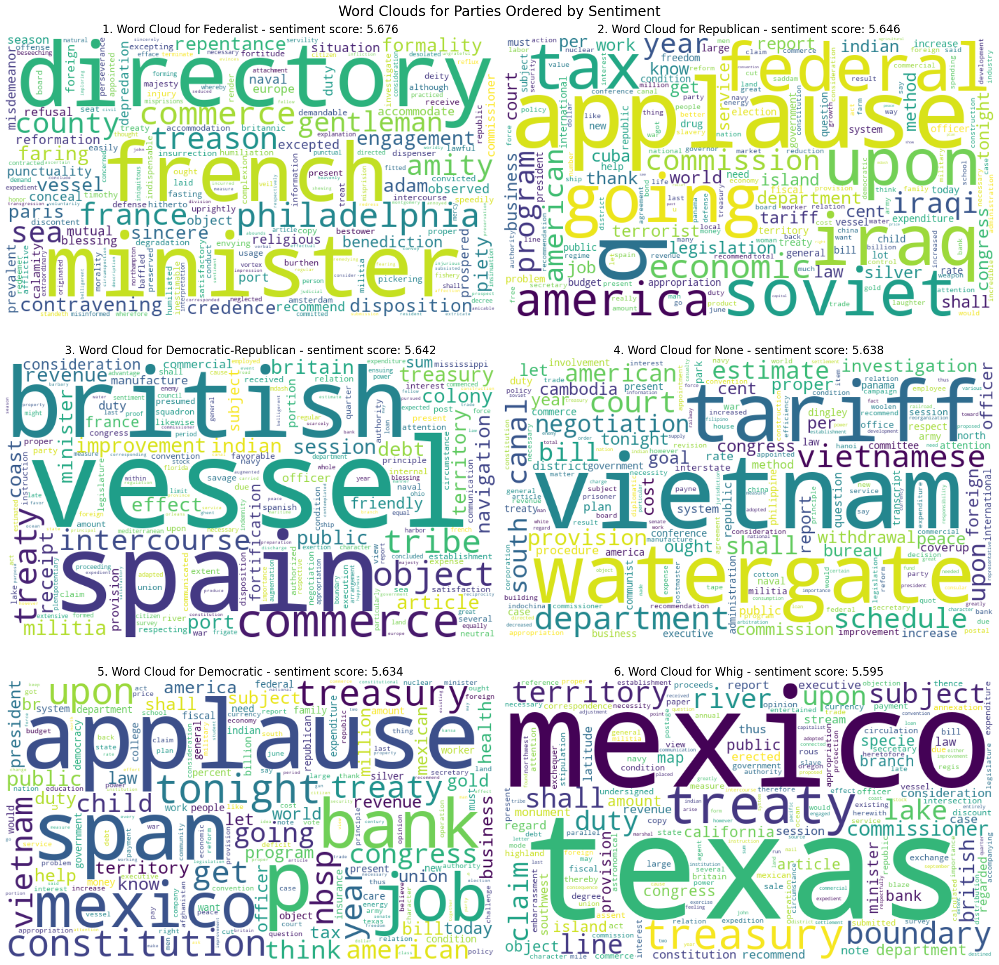

In [41]:
# order parties by average sentiment
avg_party_sentiments = {party: np.mean(sentiments) for party, sentiments in party_sentiments.items()}
sorted_parties = sorted(avg_party_sentiments, key=avg_party_sentiments.get, reverse=True)

# plot word clouds for the parties ordered by sentiment
fig, axs = plt.subplots(3, 2, figsize=(20, 20))
fig.suptitle('Word Clouds for Parties Ordered by Sentiment', fontsize=20)
for i, party in enumerate(sorted_parties):
    party_tfidf = {}
    for speech in parties_dict[party]:
        for word, score in tfidf_speech[speech].items():
            party_tfidf[word] = party_tfidf.get(word, 0.0) + score
    wordcloud = WordCloud(width=700, height=400, collocations=False, background_color='white').generate_from_frequencies(party_tfidf)
    ax = plt.subplot(3, 2, i + 1)
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis('off')
    plt.title(f"{i+1}. Word Cloud for {party} - sentiment score: {avg_party_sentiments[party]:.3f}", fontsize=16)

plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1, hspace=0.3, wspace=0.3)
plt.tight_layout()
plt.show()



From our analysis, we can see the **Federalist Party** appears as the "happiest" with the highest average sentiment score, while the **Whig Party** ranks as the "saddest". Federalists seem to frequently emphasize terms like *commerce*, *minister* and *treaty* reflecting their focus on international relations and trade. On the other hand Whigs often mention *mexico*, *treaty* and *boundary*, focusing on territorial expansion and foreign policy. However, the average sentiment scores across all parties show only a slight variation.

Parties like the Democratic-Republican Party show a strong focus on diplomacy and governance, with terms like *commerce* and *militia*. The Democratic Party emphasizes financial and constitutional topics with words like *bank*, *treasury* and *constitution*. In contrast, Republican speeches are characterized by terms such as *iraq*, *economic* and *tax* suggesting a focus on economic policies and national identity, with an undertone of patriotism supported by words like *america* and *federal*.

We can also visualize historical shifts, with terms like *vietnam* and *watergate* dominating speeches without formal party affiliations.

### Sentiment analysis by Louvain Community

In [181]:
# aggregate sentiment scores for each community
community_sentiments = {community: [] for community in louvain_colors}
for node, data in SpeechNet.nodes(data=True):
    community = data.get('louvain_community')
    sentiment = data.get('sentiment')
    if community in louvain_colors:
        community_sentiments[community].append(sentiment)

largest_communities = sorted(community_sentiments, key=lambda x: len(community_sentiments[x]), reverse=True)[:6]
# calculate average sentiment for each community
avg_community_sentiments = {community: np.mean(sentiment) for community, sentiment in community_sentiments.items()}

# average sentiment of 6 largest communities
print("Average sentiment of 6 largest communities:")
for community in largest_communities:
    print(f"Community {community}: {avg_community_sentiments[community]:.3f}")


Average sentiment of 6 largest communities:
Community 12: 5.713
Community 0: 5.632
Community 18: 5.543
Community 20: 5.712
Community 15: 5.562
Community 3: 5.620


The average sentiment of the 6 largest communities ranges narrowly from 5.460 to 5.750, indicating a consistent tone across these groups.

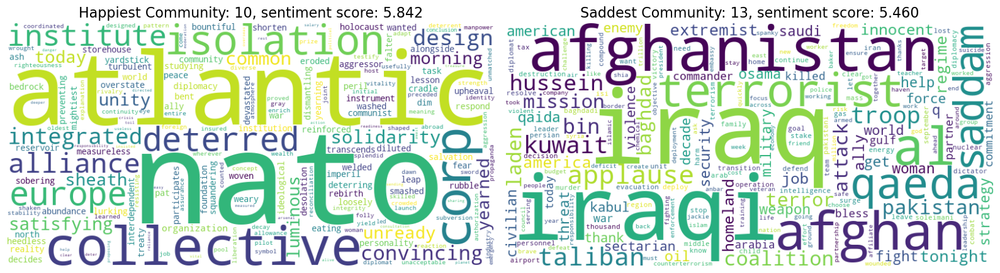

In [ ]:
# get happiest and saddest communities on average based on community sentiments dictionary
happiest_community = max(avg_community_sentiments, key=avg_community_sentiments.get)
saddest_community = min(avg_community_sentiments, key=avg_community_sentiments.get)

# combine TF-IDF for the happiest community
happiest_community_tfidf = {}
for speech in louvain_dict[happiest_community]:
    for word, score in tfidf_speech[speech].items():
        happiest_community_tfidf[word] = happiest_community_tfidf.get(word, 0.0) + score

# combine TF-IDF for the saddest community
saddest_community_tfidf = {}
for speech in louvain_dict[saddest_community]:
    for word, score in tfidf_speech[speech].items():
        saddest_community_tfidf[word] = saddest_community_tfidf.get(word, 0.0) + score

# plot word clouds
happiest_community_wordcloud = WordCloud(width=800, height=400, collocations=False, background_color='white').generate_from_frequencies(happiest_community_tfidf)
saddest_community_wordcloud = WordCloud(width=800, height=400, collocations=False, background_color='white').generate_from_frequencies(saddest_community_tfidf)

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.imshow(happiest_community_wordcloud, interpolation="bilinear")
plt.axis('off')
plt.title(f"Happiest Community: {happiest_community}, sentiment score: {avg_community_sentiments[happiest_community]:.3f}", fontsize=16)
plt.subplot(1, 2, 2)
plt.imshow(saddest_community_wordcloud, interpolation="bilinear")
plt.axis('off')
plt.title(f"Saddest Community: {saddest_community}, sentiment score: {avg_community_sentiments[saddest_community]:.3f}", fontsize=16)
plt.tight_layout()
plt.show()


From the wordclouds above, we can see distinct thematic differences between the happiest and saddest communities. 

The **happiest community** has a clear focus on collective defense and international cooperation, with terms like *atlantic*, *nato*, *corp*, *collective* and *alliance*. These words suggest a community that emphasizes unity, security and international relationships. The high sentiment scores could indicate a positive outlook on international collaborations, defense and alliances. 

In contrast, the **saddest community** revolves around military conflict and war, especially in the Middle East, being dominated by highly negative and charged terms such as *iraq*, *afghanistan*, *terrorist*, *qaeda*, *saddam* and *taliban*. The negativity of these terms suggests a community focused on war, terrorism and military operations, with a clear emphasis on the Iraq and Afghanistan conflicts. These communities are marked by a darker tone, which is reflected in their low sentiment scores. 

## Investigate relationship with economic data

In order to analyse how economic conditions may influence the tone, sentiment or topics of speeches, we decided to incorporate GDP data into the network by mapping each speech to the real GDP per capita of the corresponding year. This data was obtained from [MeasuringWorth.com](https://www.measuringworth.com/datasets/), , which offers a wide range of economic datasets, including historical data from various periods in U.S. history. By exploring correlations between GDP and speech sentiment, we aim to uncover potential relationships between the national economic situation and political speeches.

In [44]:
# add gdps to the speeches
gdp_data = pd.read_csv('USGDP_1790-2024.csv', skiprows=2)
gdp_data.columns.values[1] = 'Real GDP per capita (dollars)'
gdp_data['Real GDP per capita (dollars)'] = gdp_data['Real GDP per capita (dollars)'].str.replace(',', '').astype(float)

# map years to GDP values
year_to_gdp = dict(zip(gdp_data['Year'], gdp_data['Real GDP per capita (dollars)']))
# map nodes to their GDP values
node_to_gdp = {}
for node, data in SpeechNet.nodes(data=True):
    year = data['date'].year
    node_to_gdp[node] = year_to_gdp.get(year, None)
# set the GDP attribute for the nodes
nx.set_node_attributes(SpeechNet, node_to_gdp, 'gdp')

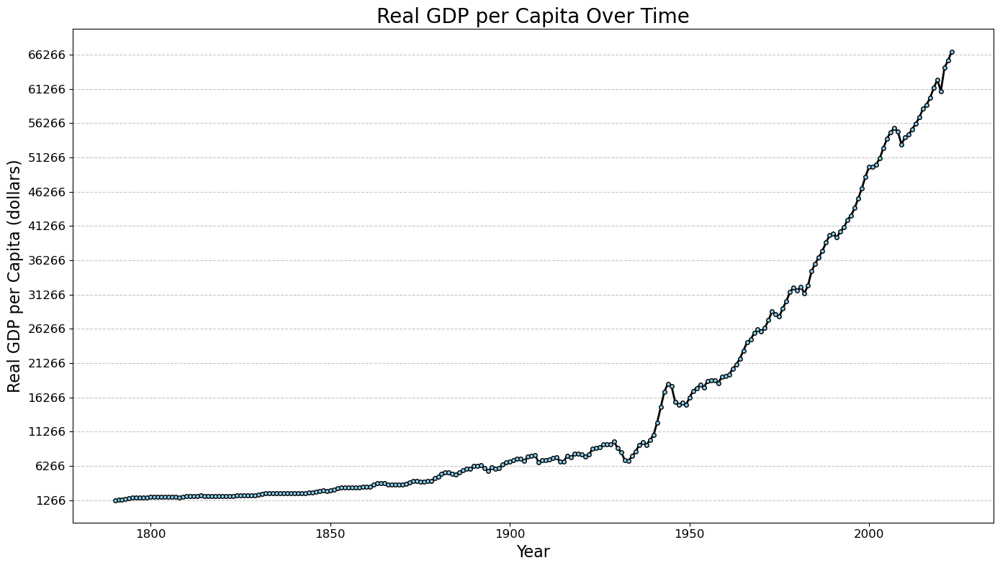

In [45]:
# plot the GDP over time
years = gdp_data['Year']
gdps = gdp_data['Real GDP per capita (dollars)']
plt.figure(figsize=(14, 8))
plt.plot(years, gdps, color='black', marker='o', linestyle='-', linewidth=2, markersize=4, markerfacecolor='skyblue', markeredgecolor='black')
plt.title('Real GDP per Capita Over Time', fontsize=20)
plt.xlabel('Year', fontsize=16)
plt.ylabel('Real GDP per Capita (dollars)', fontsize=16)
plt.xticks(fontsize=12)
y_ticks = range(int(min(gdps)), int(max(gdps)) + 1, 5000)
plt.yticks(y_ticks, fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

Plotting the real GDP per capita, a general upward trend becomes clear, reflecting long-term economic growth. 
From 1790 until around 1880 the GDP per capita shows a slower but steady growth. Afer this period there are more fluctuations in the annual values, reflecting a faster pace of economic growth. These variations correspond to historical economic events. For example, there are some decreases during recessions, such as the Great Depression in the 1930s, the financial crisis of 2008 and the covid pandemic in 2020. Additionally, we can observe periods of rapid economic growth, particularly during the WWII boom from 1939 to 1945 and the economic surge in the late 1990s. 

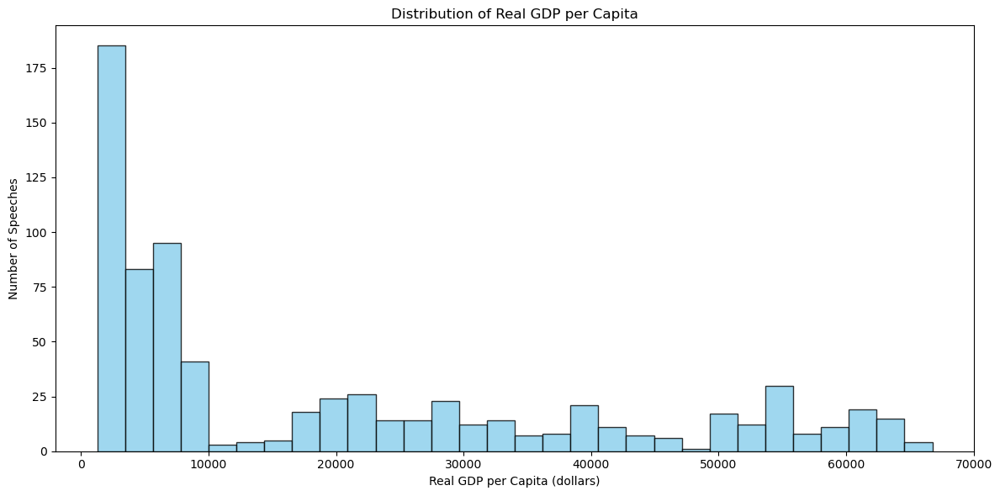

In [46]:
# bar plot of gdps distribution over speeches
plt.figure(figsize=(12, 6))
gdps = [data['gdp'] for _, data in SpeechNet.nodes(data=True) if data['gdp'] is not None]
hist, bin_edges = np.histogram(gdps, bins=30)
bin_centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])
plt.bar(bin_centers, hist, width=bin_edges[1] - bin_edges[0], color='skyblue', edgecolor='black', alpha=0.8)    
plt.title('Distribution of Real GDP per Capita')
plt.xlabel('Real GDP per Capita (dollars)')
plt.ylabel('Number of Speeches')
plt.tight_layout()
plt.show()

COMMENT...

In [47]:
# get the sentiment scores for each year
sentiment_years = defaultdict(list)
for node, data in SpeechNet.nodes(data=True):
    year = data['date'].year
    sentiment = data.get('sentiment')
    if sentiment is not None:
        sentiment_years[year].append(sentiment)

# calculate the average sentiment for each year
average_sentiment_years = {year: np.mean(sentiment) for year, sentiment in sentiment_years.items()}

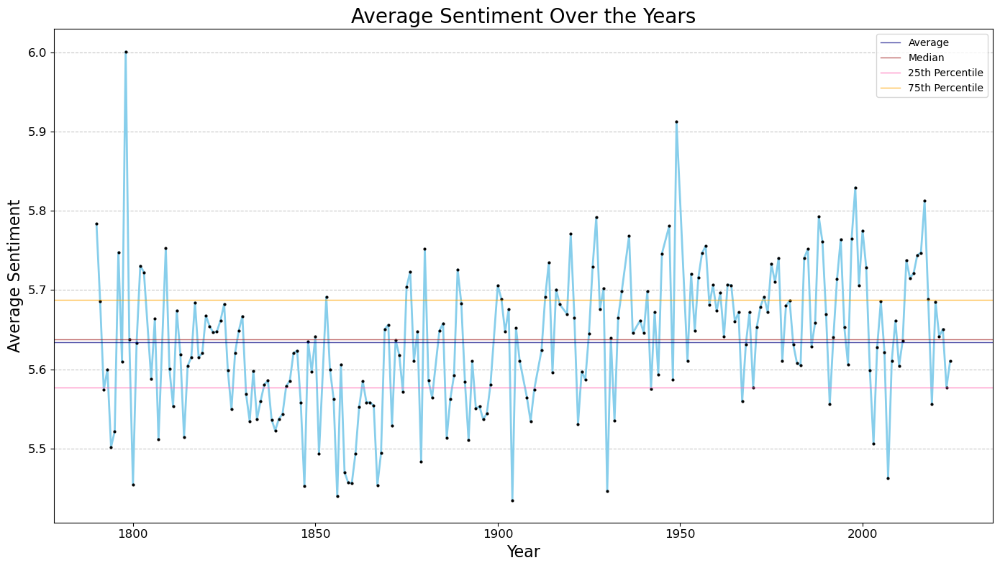

In [48]:
# calculate the median, mean, 25th and 75th percentiles of the average sentiment per year
median_sentiment_years = np.median(list(average_sentiment_years.values()))
percentile_25_years = np.percentile(list(average_sentiment_years.values()), 25)
percentile_75_years = np.percentile(list(average_sentiment_years.values()), 75)
average_average_sentiment_years = np.mean(list(average_sentiment_years.values()))

# plot the average sentiment over the years with mean, median and 25th and 75th percentiles
plt.figure(figsize=(14, 8))
plt.plot(list(average_sentiment_years.keys()), list(average_sentiment_years.values()), color='skyblue', marker='o', linestyle='-', linewidth=2, markersize=2, markerfacecolor='black', markeredgecolor='black')
plt.axhline(average_average_sentiment_years, color='navy', linestyle='-', linewidth=1, label='Average', alpha=0.7)
plt.axhline(median_sentiment_years, color='brown', linestyle='-', linewidth=1, label='Median', alpha=0.7)
plt.axhline(percentile_25_years, color='hotpink', linestyle='-', linewidth=1, label='25th Percentile', alpha=0.7)
plt.axhline(percentile_75_years, color='orange', linestyle='-', linewidth=1, label='75th Percentile', alpha=0.7)
plt.legend()
plt.title('Average Sentiment Over the Years', fontsize=20)
plt.xlabel('Year', fontsize=16)
plt.ylabel('Average Sentiment', fontsize=16)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

COMMENT....

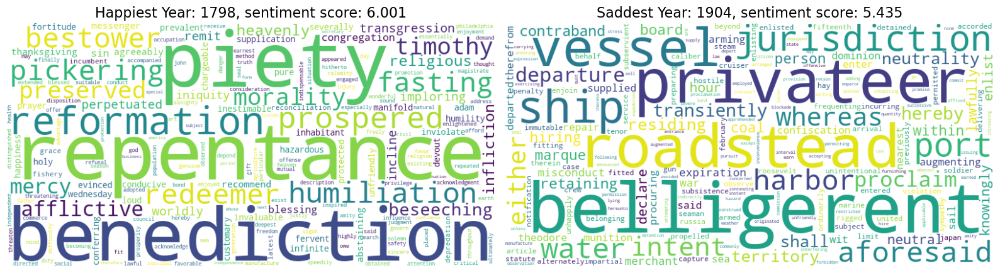

In [49]:
# get happiest and saddest years on average 
happiest_year = max(average_sentiment_years, key=average_sentiment_years.get)
saddest_year = min(average_sentiment_years, key=average_sentiment_years.get)

# combine TF-IDF for the happiest year
happiest_year_tfidf = {}
for node, data in SpeechNet.nodes(data=True):
    year = data['date'].year
    if year == happiest_year:
        for word, score in tfidf_speech[node].items():
            happiest_year_tfidf[word] = happiest_year_tfidf.get(word, 0.0) + score

# combine TF-IDF for the saddest community
saddest_year_tfidf = {}
for node, data in SpeechNet.nodes(data=True):
    year = data['date'].year
    if year == saddest_year:
        for word, score in tfidf_speech[node].items():
            saddest_year_tfidf[word] = saddest_year_tfidf.get(word, 0.0) + score

# plot word clouds
happiest_year_wordcloud = WordCloud(width=800, height=400, collocations=False, background_color='white').generate_from_frequencies(happiest_year_tfidf)
saddest_year_wordcloud = WordCloud(width=800, height=400, collocations=False, background_color='white').generate_from_frequencies(saddest_year_tfidf)

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.imshow(happiest_year_wordcloud, interpolation="bilinear")
plt.axis('off')
plt.title(f"Happiest Year: {happiest_year}, sentiment score: {average_sentiment_years[happiest_year]:.3f}", fontsize=16)
plt.subplot(1, 2, 2)
plt.imshow(saddest_year_wordcloud, interpolation="bilinear")
plt.axis('off')
plt.title(f"Saddest Year: {saddest_year}, sentiment score: {average_sentiment_years[saddest_year]:.3f}", fontsize=16)
plt.tight_layout()
plt.show()
 

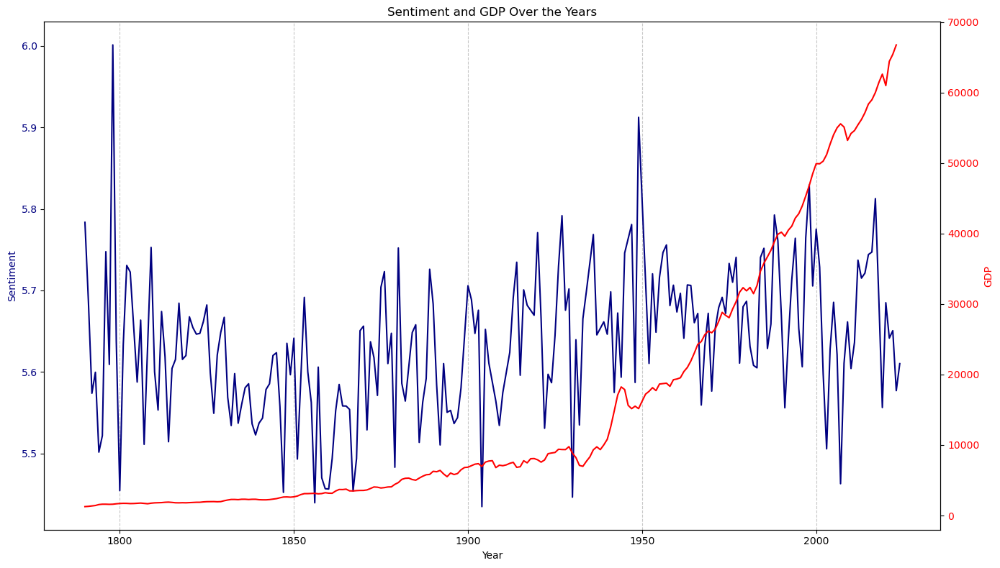

In [50]:
# combine plot of sentiment and GDP over the years
fig, ax1 = plt.subplots(figsize=(14, 8))

ax1.plot(list(average_sentiment_years.keys()), list(average_sentiment_years.values()), color='navy', label='Sentiment')
ax1.set_xlabel('Year')
ax1.set_ylabel('Sentiment', color='navy')
ax1.tick_params(axis='y', labelcolor='navy')
plt.grid(axis='x', linestyle='--', alpha=0.7)

ax2 = ax1.twinx()
ax2.plot(gdp_data['Year'], gdp_data['Real GDP per capita (dollars)'] , color='red', label='GDP', linestyle='-')
ax2.set_ylabel('GDP', color='red')
ax2.tick_params(axis='y', labelcolor='red')

plt.title('Sentiment and GDP Over the Years')
plt.tight_layout()
plt.show()


In [51]:
# correlation between average yearly sentiment and GDP:
# filter out years that are not in gdp_data
gdp_data_forcorr = gdp_data[gdp_data['Year'].isin(average_sentiment_years.keys())]
# filter out years that do not have sentiment data
average_sentiment_years_forcorr = {year: sentiment for year, sentiment in average_sentiment_years.items() if year in gdp_data_forcorr['Year'].values}

# create a dataframe for the correlation
df = pd.DataFrame({'Sentiment': average_sentiment_years_forcorr.values(), 'GDP': gdp_data_forcorr['Real GDP per capita (dollars)']})
correlation = df['Sentiment'].corr(df['GDP'])
print(f"Correlation between sentiment and GDP: {correlation}")

Correlation between sentiment and GDP: 0.291564192308873


In [52]:
# calculate the correlation between sentiment and 1 year lagged GDP
lagged_gdp_values = gdp_data['Real GDP per capita (dollars)'][1:].values  # use gdp from the following year

# align the sentiment data with the GDP data
for year in gdp_data['Year']:
    if year not in average_sentiment_years.keys():
        average_sentiment_years[year] = None

sentiment_values_lagged = list(average_sentiment_years.values())
sentiment_values_lagged = [sentiment for year, sentiment in sorted(zip(average_sentiment_years.keys(), sentiment_values_lagged))][:-1][:-1]
# calculate the correlation 
lagged_df = pd.DataFrame({'Sentiment': sentiment_values_lagged, 'GDP': lagged_gdp_values})
correlation_lagged_pandas = lagged_df['GDP'].corr(lagged_df['Sentiment'])
print(f"Correlation with lagged GDP: {correlation_lagged_pandas}")

Correlation with lagged GDP: 0.3078388980389013


### GDP growth per presidential term

In [53]:
# get presidential terms
terms_df = pd.read_csv('presidential_terms.csv', sep=',')

# get list of gdps for each term and add as column to terms_df
term_gdps = []
for i, row in terms_df.iterrows():
    start_year = row['Start Year']
    end_year = row['End Year']
    president = row['President']
    # get GDPs for the term but exclude 2024 and after
    term_gdp = gdp_data[(gdp_data['Year'] >= start_year) & (gdp_data['Year'] <= end_year) & (gdp_data['Year'] <= 2024)]
    term_gdps.append(term_gdp['Real GDP per capita (dollars)'].tolist())
terms_df['GDPs'] = term_gdps

We checked for one-year presidential terms to see if they represent important dates or events in U.S. history.

In [54]:
# print terms that were only one year long and its year
one_year_terms = terms_df[terms_df['Start Year'] == terms_df['End Year']]

print('One year terms:')
print(one_year_terms[['Term', 'Start Year', 'End Year']])

One year terms:
               Term  Start Year  End Year
13      W. Harrison        1841      1841
21       Lincoln II        1865      1865
26         Garfield        1881      1881
32      McKinley II        1901      1901
45  F. Roosevelt IV        1945      1945


These short terms are indeed important for our analysis considering they represent times where a president's term was cut short due to unforeseen events, such as death or assassination. Therefore, to avoid skewing the GDP growth calculation, we decided to set the GDP growth for these terms to 0, so we ensure a more nuanced analysis

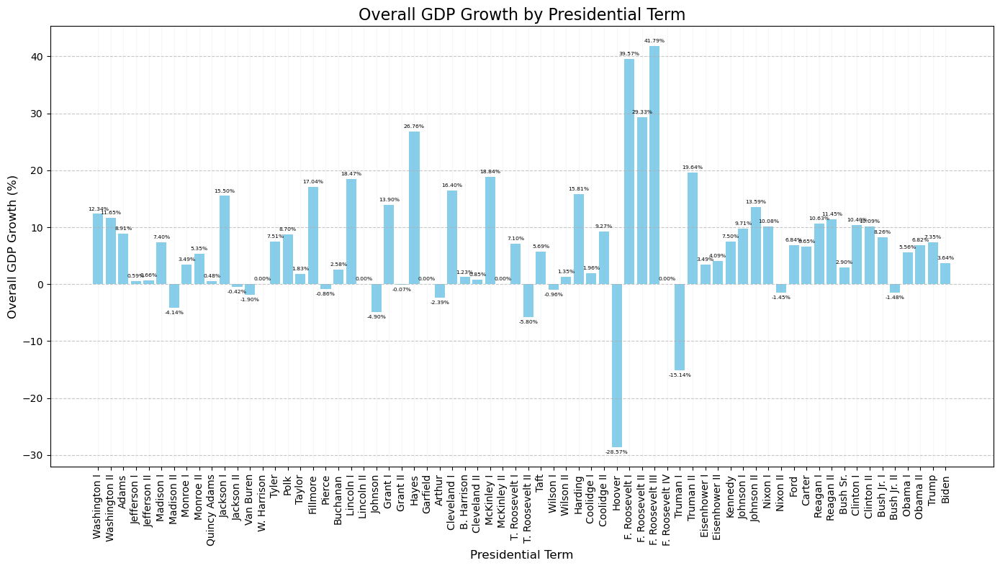

In [55]:
# calculate GDP growth for each term
terms_df['GDP_growth'] = terms_df['GDPs'].apply(lambda gdp_list: (gdp_list[-1] - gdp_list[0]) / gdp_list[0] * 100 if len(gdp_list) > 1 else 0)

# plot overall GDP growth by presidential term
plt.figure(figsize=(14, 8))
bars = plt.bar(terms_df['Term'], terms_df['GDP_growth'], color='skyblue')
plt.xticks(rotation=90, fontsize=10)
plt.title('Overall GDP Growth by Presidential Term', fontsize=16)
plt.xlabel('Presidential Term', fontsize=12)
plt.ylabel('Overall GDP Growth (%)', fontsize=12)
for bar in bars:
    height = bar.get_height() 
    # if the bar is positive, place text above, else place it below
    if height >= 0:
        plt.text(bar.get_x() + bar.get_width() / 2, height + 0.5,  # place text above positive bars
                 f'{height:.2f}%', ha='center', va='bottom', fontsize=5.5)
    else:
        plt.text(bar.get_x() + bar.get_width() / 2, height - 0.5,  # place text below negative bars
                 f'{height:.2f}%', ha='center', va='top', fontsize=5.5)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.grid(axis='x', linestyle='-', alpha=0.1)
plt.tight_layout()
plt.show()



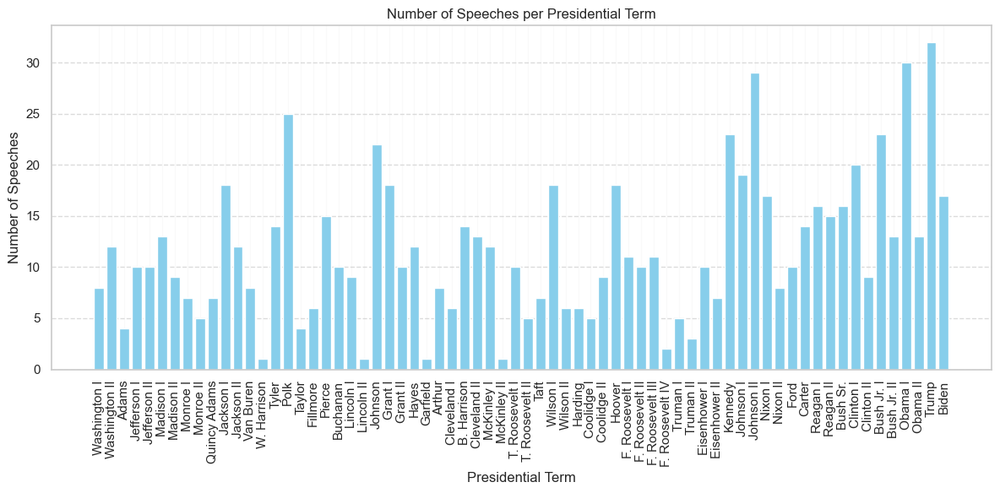

In [129]:
# plot number of speeches per term from 
term_speech_counts = {term: 0 for term in terms_df['Term'].values}
for node, data in SpeechNet.nodes(data=True):
    president = data['president']
    year = data['date'].year
    for _, row in terms_df.iterrows():
        if president == row['President'] and row['Start Year'] <= year <= row['End Year']:
            term_speech_counts[row['Term']] += 1
    
plt.figure(figsize=(12, 6))
plt.bar(range(len(term_speech_counts)), term_speech_counts.values(), color='skyblue')
plt.xticks(range(len(term_speech_counts)), term_speech_counts.keys(), rotation=90)
plt.xlabel('Presidential Term')
plt.ylabel('Number of Speeches')
plt.title('Number of Speeches per Presidential Term')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.grid(axis='x', linestyle='-', alpha=0.1)
plt.tight_layout()
plt.show()

In [57]:
# correlation between number of speeches and GDP growth per term
#create a df for the correlation
correlation_df = pd.DataFrame({'Term': list(term_speech_counts.keys()), 'Number of Speeches': list(term_speech_counts.values()), 'GDP Growth (%)': terms_df['GDP_growth']})

# calculate the correlation
correlation = correlation_df['Number of Speeches'].corr(correlation_df['GDP Growth (%)'])
print(f'Correlation between number of speeches and GDP growth: {correlation:.2f}')

Correlation between number of speeches and GDP growth: 0.08


In [58]:
# get the sentiment scores for each presiential term
sentiment_terms = defaultdict(list)
for node, data in SpeechNet.nodes(data=True):
    year = data['date'].year
    sentiment = data.get('sentiment')
    president = data['president']
    for _, row in terms_df.iterrows():
        if president == row['President'] and row['Start Year'] <= year <= row['End Year']:
            sentiment_terms[row['Term']].append(sentiment)
# calculate the average sentiment for each year
average_sentiment_terms = {term: np.mean(sentiment) for term, sentiment in sentiment_terms.items()}

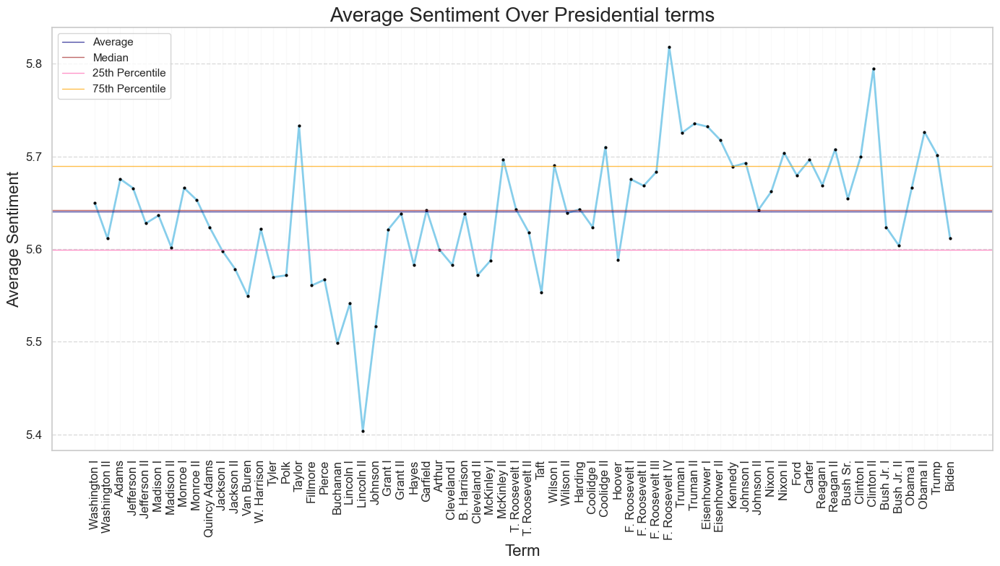

In [125]:
# calculate the median, mean, 25th and 75th percentiles of the average sentiment per year
median_sentiment_terms = np.median(list(average_sentiment_terms.values()))
percentile_25_terms = np.percentile(list(average_sentiment_terms.values()), 25)
percentile_75_terms = np.percentile(list(average_sentiment_terms.values()), 75)
average_average_sentiment_terms = np.mean(list(average_sentiment_terms.values()))

# plot the average sentiment over the years with mean, median and 25th and 75th percentiles
plt.figure(figsize=(14, 8))
plt.plot(list(average_sentiment_terms.keys()), list(average_sentiment_terms.values()), color='skyblue', marker='o', linestyle='-', linewidth=2, markersize=2, markerfacecolor='black', markeredgecolor='black')
plt.axhline(average_average_sentiment_terms, color='navy', linestyle='-', linewidth=1, label='Average', alpha=0.7)
plt.axhline(median_sentiment_terms, color='brown', linestyle='-', linewidth=1, label='Median', alpha=0.7)
plt.axhline(percentile_25_terms, color='hotpink', linestyle='-', linewidth=1, label='25th Percentile', alpha=0.7)
plt.axhline(percentile_75_terms, color='orange', linestyle='-', linewidth=1, label='75th Percentile', alpha=0.7)
plt.legend()
plt.title('Average Sentiment Over Presidential terms', fontsize=20)
plt.xlabel('Term', fontsize=16)
plt.ylabel('Average Sentiment', fontsize=16)
plt.xticks(fontsize=12, rotation=90)
plt.yticks(fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.grid(axis='x', linestyle='-', alpha=0.1)
plt.tight_layout()
plt.show()

In [68]:
#correlaiton between sentiment per term and GDP growth per term
terms_df['Sentiment'] = list(average_sentiment_terms.values())
correlation_terms = terms_df['Sentiment'].corr(terms_df['GDP_growth'])
print(f'Correlation between sentiment per term and GDP growth per term: {correlation_terms:.2f}')

Correlation between sentiment per term and GDP growth per term: 0.11


### Topic Analysis

Exploration of Topics with LDA:

We attempted to use Latent Dirichlet Allocation (LDA) to discover underlying topics in the speech transcripts. However, the results did not produce coherent or meaningful topics. The top words for each topic did not form recognizable themes, and the discovered topics did not align with our predefined topic categories or expectations. Due to these issues, we decided to discard LDA from further analysis as it did not provide valuable insights for our research.

So we decided to count the frequency of words for each topic to analyse this

Dataset obtained with the help of ChatGPT:

In [40]:
# read and extract topics from .json file
with open('topics.json', 'r') as f:
    topics = json.load(f)

Topic descriptions:

1. **Economy**: Discusses the state of a country's financial system, including growth, inflation, unemployment, and fiscal policies.
   
2. **Politics**: Covers the actions, ideologies, and policies of political leaders and parties, as well as the impact of governance on society.

3. **War and Peace**: Focuses on conflicts, military actions, peace treaties, and diplomatic efforts to prevent or resolve wars.

4. **Social Issues**: Addresses societal challenges like inequality, poverty, human rights, and social justice that require government attention.

5. **Environment**: Relates to discussions on climate change, sustainability, pollution, and the government's role in protecting the planet.

6. **Terrorism**: Examines issues related to terrorist threats, counterterrorism measures, and the impact of terrorism on national and global security.

7. **People and Society**: Explores cultural norms, human rights, social values, and the role of individuals and communities in shaping society.

8. **Violence**: Focuses on physical harm and aggression, including criminal violence, domestic violence, and the societal impact of violent behavior.

In [41]:
# calculate the number of occurrences of each topic in speech
topic_counts = {topic: Counter() for topic in topics}

for node, data in SpeechNet.nodes(data=True):
    year = data['date'].year
    text = data['transcript']
    text = process_text(text)
    for topic, keywords in topics.items():
        topic_counts[topic][node] += sum(text.count(word) for word in keywords)


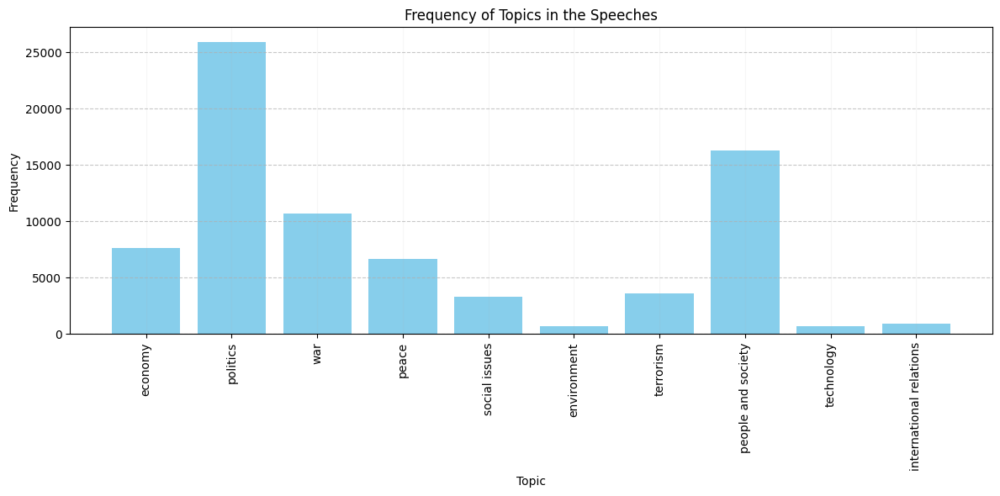

In [42]:
# plot frequency of each topic in the speeches during all years
topic_frequencies = {topic: sum(count.values()) for topic, count in topic_counts.items()}
plt.figure(figsize=(12, 6))
plt.bar(range(len(topic_frequencies)), topic_frequencies.values(), color='skyblue')
plt.xticks(range(len(topic_frequencies)), topic_frequencies.keys(), rotation=90)
plt.xlabel('Topic')
plt.ylabel('Frequency')
plt.title('Frequency of Topics in the Speeches')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.grid(axis='x', linestyle='-', alpha=0.1)
plt.tight_layout()
plt.show()

In [43]:
# frequency of each topic per year 
topic_counts_year = pd.DataFrame(topic_counts)
topic_counts_year['Year'] = [SpeechNet.nodes[node]['date'].year for node in topic_counts_year.index]
topic_counts_year = topic_counts_year.groupby('Year').sum()

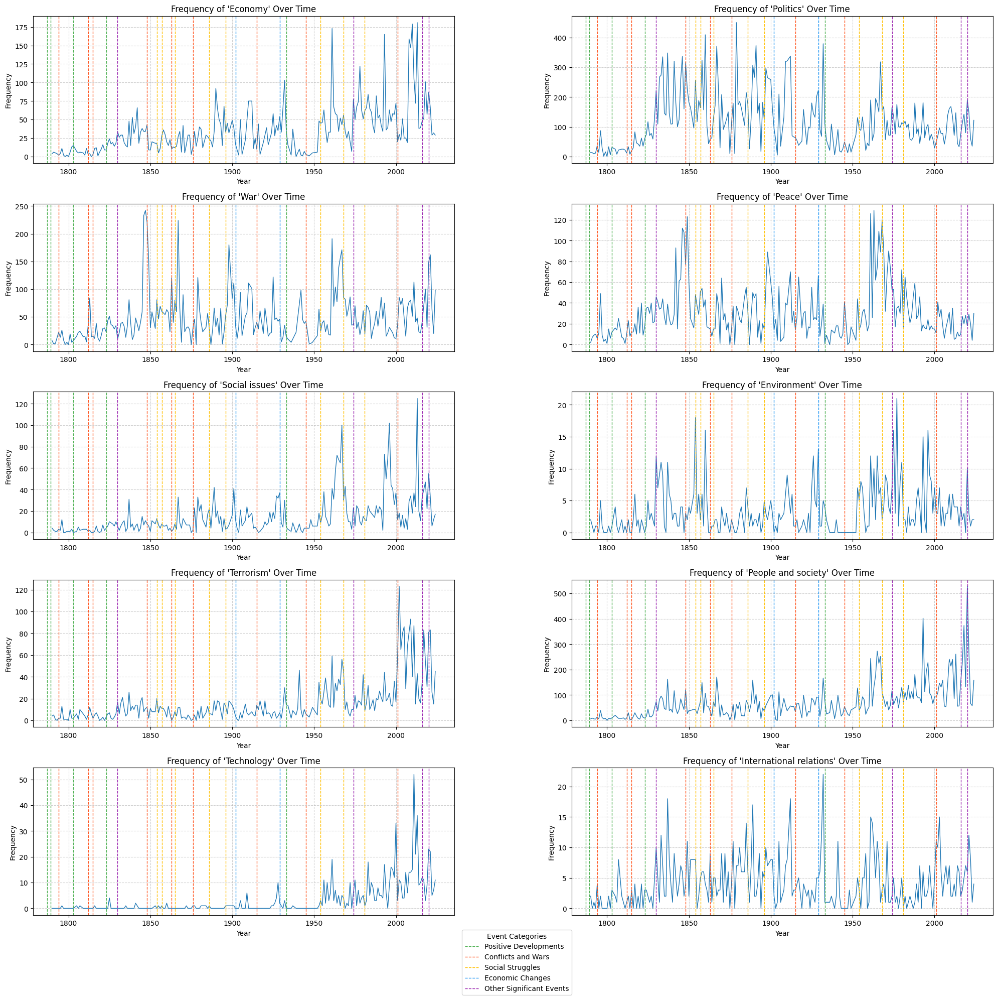

In [57]:
import matplotlib.pyplot as plt
import json

# Load historical events
with open('events.json', 'r') as f:
    events = json.load(f)

# Define category colors
category_colors = {
    "Positive Developments": "#4CAF50",  # Green
    "Conflicts and Wars": "#FF5722",    # Red
    "Social Struggles": "#FFC107",      # Yellow
    "Economic Changes": "#2196F3",      # Blue
    "Other Significant Events": "#9C27B0" # Purple
}

# Assume topics and topic_counts_year are already defined
# sns.set(style="whitegrid")  # Uncomment if using seaborn
fig, axs = plt.subplots(5, 2, figsize=(20, 20))

for i, topic in enumerate(topics):
    ax = plt.subplot(5, 2, i + 1)
    years = topic_counts_year.index
    frequencies = topic_counts_year[topic]
    
    # Plot topic frequencies
    plt.plot(years, frequencies, label=topic, linestyle='-', linewidth=1)
    plt.title(f"Frequency of '{topic.capitalize()}' Over Time")
    plt.xlabel("Year")
    plt.ylabel("Frequency")
    plt.grid(True, linestyle='--', alpha=0.6)
    
    # Plot historical events with vertical lines
    for event in events:
        plt.axvline(
            event['date'], 
            color=category_colors[event['category']], 
            linestyle='--', 
            linewidth=1, 
            label=f"{event['category']} ({event['date']})"
        )
    
# Create a custom legend for event categories
handles = [plt.Line2D([0], [0], color=color, linestyle='--', linewidth=1, label=category)
           for category, color in category_colors.items()]
plt.legend(handles=handles, title="Event Categories", loc='upper right', bbox_to_anchor=(0, -0.1), borderaxespad=0.)

plt.tight_layout()
plt.show()


topic distribution across parties

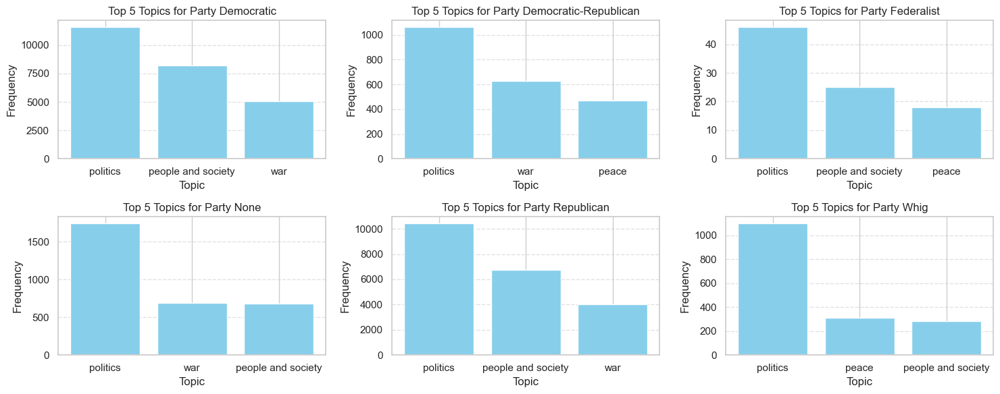

In [198]:
# party topic counts
topic_counts_party = pd.DataFrame(topic_counts)
topic_counts_party['party'] = [SpeechNet.nodes[node]['party'] for node in topic_counts_party.index]
topic_counts_party = topic_counts_party.groupby('party').sum()
        
# Get top 3 topics for each party
top3_topics_party = {}
for party in topic_counts_party.index:
    top3_topics_party[party] = topic_counts_party.loc[party].nlargest(3).index

# plot the top 3 topics for each party
fig, axs = plt.subplots(2, 3, figsize=(15, 6))
for i, party in enumerate(top3_topics_party):
    ax = plt.subplot(2, 3, i + 1)
    topics = top3_topics_party[party]
    frequencies = topic_counts_party.loc[party, topics]
    plt.bar(topics, frequencies, color='skyblue')
    plt.title(f"Top 5 Topics for Party {party}")
    plt.xlabel("Topic")
    plt.ylabel("Frequency")
    plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


Topic Distribution Across Communities

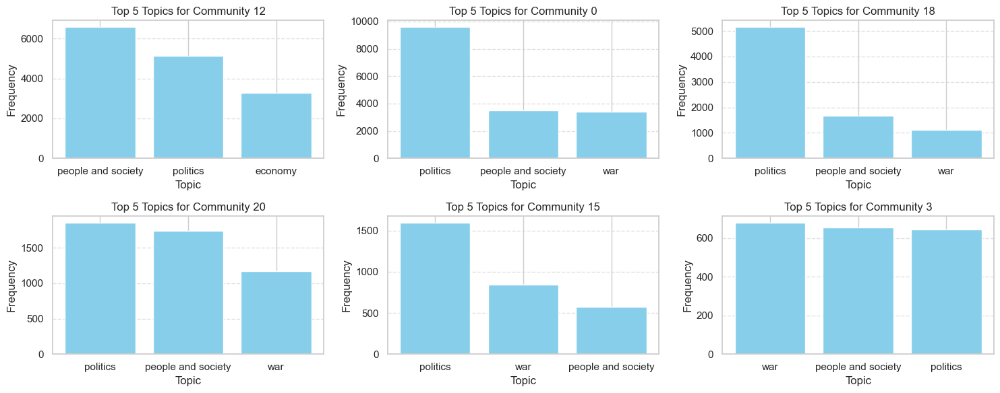

In [199]:
# community topic counts
topic_counts_community = pd.DataFrame(topic_counts)
topic_counts_community['community'] = [SpeechNet.nodes[node]['louvain_community'] for node in topic_counts_community.index]
topic_counts_community = topic_counts_community.groupby('community').sum()
        
# Get top 3 topics for each community of the 6 largest communities
top3_topics_community = {}
for community in largest_communities:
    top3_topics_community[community] = topic_counts_community.loc[community].nlargest(3).index

# plot the top 3 topics for each community
fig, axs = plt.subplots(2, 3, figsize=(15, 6))
for i, community in enumerate(top3_topics_community):
    ax = plt.subplot(2, 3, i + 1)
    topics = top3_topics_community[community]
    frequencies = topic_counts_community.loc[community, topics]
    plt.bar(topics, frequencies, color='skyblue')
    plt.title(f"Top 5 Topics for Community {community}")
    plt.xlabel("Topic")
    plt.ylabel("Frequency")
    plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


In [194]:
# topic for happiest and saddest communities
happiest_community_topics = topic_counts_community.loc[happiest_community].nlargest(3).index
saddest_community_topics = topic_counts_community.loc[saddest_community].nlargest(3).index

# print the top 3 topics for the happiest and saddest communities
print(f"Top 3 topics for happiest community {happiest_community}:")
print(list(happiest_community_topics))
print(f"Top 3 topics for saddest community {saddest_community}:")
print(list(saddest_community_topics))


Top 3 topics for happiest community 10:
['peace', 'war', 'people and society']
Top 3 topics for saddest community 13:
['war', 'people and society', 'terrorism']


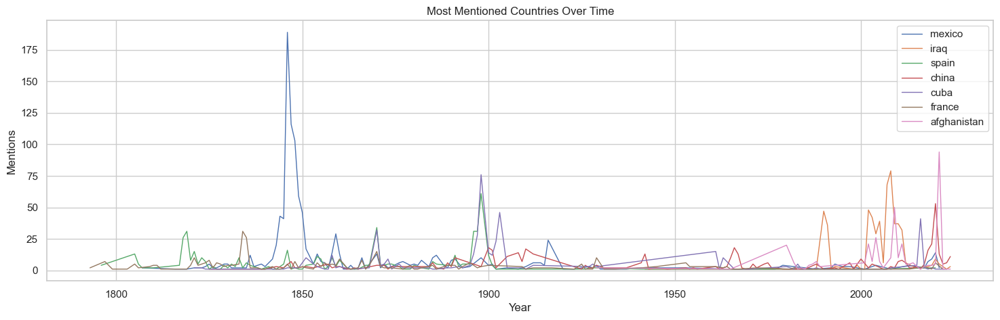

In [78]:

# get country names
country_names = {country.name.lower() for country in pycountry.countries}
country_names.update({country.official_name.lower() for country in pycountry.countries if hasattr(country, 'official_name')})

# extract country mentions from speeches per year
country_mentions = Counter()
for node, data in SpeechNet.nodes(data=True):
    year = data['date'].year
    text = data['transcript']
    words = process_text(text)
    for word in words:
        if word in country_names:
            country = word
            country_mentions[(year, country)] += 1


# select the most frequently mentioned countries over time
top_country_mentions = pd.DataFrame([(year, country, count) for (year, country), count in country_mentions.items()],columns=['year', 'country', 'mentions'])
top_countries = top_country_mentions.groupby("country")["mentions"].sum().sort_values(ascending=False).head(7).index
top_country_mentions = top_country_mentions[top_country_mentions["country"].isin(top_countries)]

# plot the most mentioned countries
plt.figure(figsize=(18, 5))
for country in top_countries:
    mentions = top_country_mentions[top_country_mentions['country'] == country]
    plt.plot(mentions["year"], mentions["mentions"], label=country, linestyle='-', linewidth=1)
plt.title("Most Mentioned Countries Over Time")
plt.xlabel("Year")
plt.ylabel("Mentions")
plt.legend()
plt.grid(True)
plt.show()

In [76]:
# upload recessions data
recessions = pd.read_csv('recession_dates.csv')

TODO: add a shadow for the recession period to plots to analyse. add important date (war, terrorist attacks,...). 

- inevstigate association between communities and topics
- central presidents vs sentiment vs topic
- sentiment propagation

Do similar speech transcripts present similar sentiments? 

In [ ]:
sentiment_similarity_matrix = np.zeros((len(sentiments), len(sentiments)))

for i in range(len(sentiments)):
    for j in range(len(sentiments)):
        sentiment_similarity_matrix[i, j] = np.abs(sentiments[list(sentiments.keys())[i]] - sentiments[list(sentiments.keys())[j]])



In [ ]:
# create a matrix from the weights of the edges
edge_weights = nx.to_numpy_array(SpeechNet)
# ignore not connected nodes
sentiment_similarity_matrix = sentiment_similarity_matrix[edge_weights > 0]
edge_weights = edge_weights[edge_weights > 0]


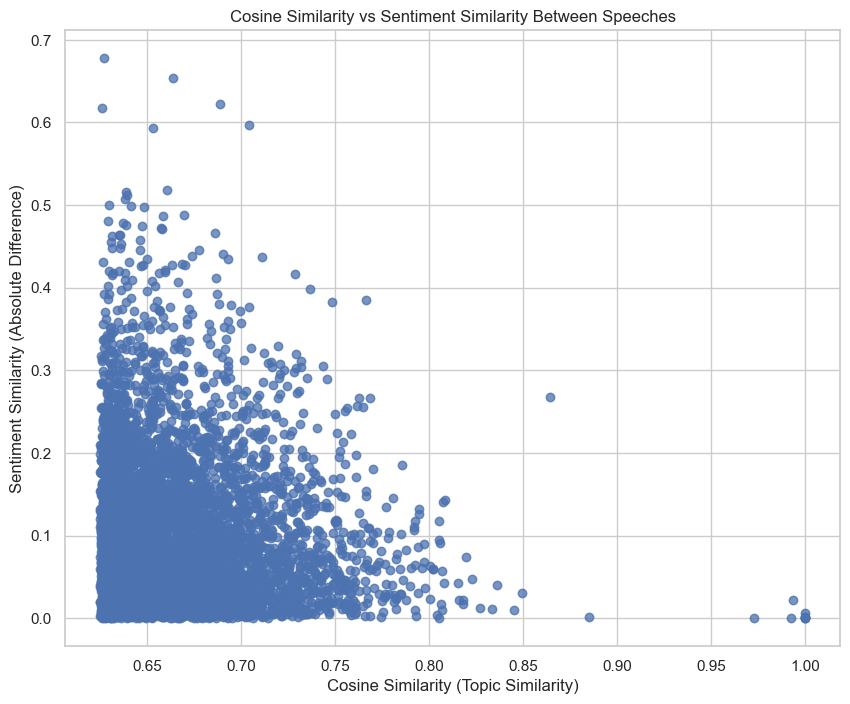

In [ ]:
# Plot the relationship between cosine similarity and sentiment similarity

plt.figure(figsize=(10, 8))
plt.scatter(edge_weights.flatten(), sentiment_similarity_matrix.flatten(), alpha=0.5)
plt.xlabel('Cosine Similarity (Topic Similarity)')
plt.ylabel('Sentiment Similarity (Absolute Difference)')
plt.title('Cosine Similarity vs Sentiment Similarity Between Speeches')
plt.show()


In [244]:
#correlation between cosine similarity and sentiment similarity
correlation = np.corrcoef(edge_weights.flatten(), sentiment_similarity_matrix.flatten())[0,1]
print(f'Correlation between cosine similarity and sentiment similarity: {correlation:.2f}')

Correlation between cosine similarity and sentiment similarity: -0.11


Both from the scatterplot and the correlation coefficient, there is no clear association between thematic similarity (measured by cosine similarity of the speeches) and sentiment similarity (measured by the absolute difference in sentiment scores) for the connected speeches. The absence of correlation indicate that even speeches with similar topics can have varying emotional tones. This might reflect different perspectives, audiences or contexts that the speakers use to address similar subjects.